# 8-bar linkage: Relay system

Based on the following relay system mechanism: https://www.youtube.com/watch?v=uDJE5C8i5lw

# ![8-bar linkage animation](./assets/mechanism-photo.png)

Add some helper functions that will be used throughout the project.

In [1]:
# Initialize the environment
import numpy as np

# Helper functions
def deg_to_rad(deg):
    return deg * np.pi / 180

def rad_to_deg(rad):
    return rad * 180 / np.pi

## Kinematic Analysis

- **Position Analysis**:
    - Determine the positions of all joints and links in the mechanism using loop closure equations.
    - Solve for unknown angles iteratively.
    - Use the solved angles to calculate the positions

- **Velocity Analysis**:
    - Compute angular velocities of the links using the derivatives of the loop closure equations.
    - Calculate linear velocities of the joints based on angular velocities, angles (calculated in the previous step) and link dimensions.

- **Acceleration Analysis**:
    - Solve for angular accelerations using the second derivatives of the loop closure equations.
    - Determine linear accelerations of the joints from angular accelerations and link dimensions.

- **Error Validation**:
    - Validate position, velocity, and acceleration calculations by comparing results obtained through different 'chains' or 'paths'.
    - Analyze absolute and relative errors to ensure numerical stability and accuracy.

### Geometry of the mechanism

Describe the geometry of the system:
- The positions of the fixed joints A, C, D, I and J
- The lengths of the bars
- The actuation (constant for our mechanism's application)
- Initial guesses for the starting angles of the bars

In [2]:
# Default positions
# A = (0.0, 0.0)
# C = (-0.185, -0.109)
# D = (-0.273, -0.109)
# I = (0.327, 0.327)
# J = (0.109, -0.109)
# r2 = 0.106
# r3 = 0.658
# r31 = 0.277
# r32 = r3 - r31
# r4 = 0.226
# r5 = 0.510
# r6 = 0.206
# r7 = 0.621
# r71 = 0.413
# r72 = r7 - r71
# r8 = 0.161
# r9 = 0.537
# r10 = 0.366

# Interesting positions:
# 1. A = (0, -0.0327): singularity where bars 2 and 7 are aligned, creating massive velocities, accelerations, forces and numeric instability!

# Convertion rates (old:new)
# 1. 55:0.6

# Ground coordinates:
x_A, y_A = 0.0, 0 # m
x_C, y_C = -0.185, -0.109 # m
x_D, y_D = -0.273, -0.109 # m
x_I, y_I = 0.327, 0.327 # m
x_J, y_J = 0.109, -0.109 # m

# Mechanism's geometrical parameters:
r2 = 0.106 # m
r3 = 0.658 # m
r31 = 0.277 # m
r32 = r3 - r31 # m
r4 = 0.226 # m
r5 = 0.510 # m
r6 = 0.206 # m
r7 = 0.621 # m
r71 = 0.413 # m
r72 = r7 - r71 # m
r8 = 0.161 # m
r9 = 0.537 # m
r10 = 0.366 # m

# Shorthand to be used in functions (note that r3 and r72 are not used in the model!!)
link_parameters = [r2, r3, r31, r32, r4, r5, r6, r7, r71, r72, r8, r9, r10]
geometry_parameters = [x_A, y_A, x_C, y_C, x_D, y_D, x_I, y_I, x_J, y_J, *link_parameters]

# Actuation
omega = 0.5 # rad/s
A = np.pi / 2 # amplitude or angle bounds (only used if the actuation is harmonic like in the exercise example)

# Definition of simulation period:
t_begin = 0  # start time of simulation
t_end = 2 * np.pi / omega  # end time of simulation
Ts = 0.05  # time step of simulation
t = np.arange(t_begin, t_end + Ts, Ts)  # time vector

# Contrary to the exercise example, we will use a constant angular motion
theta_2 = omega * t # angle in rad
dtheta_2 = omega * np.ones_like(t) # angular velocity in rad/s
ddtheta_2 = np.zeros_like(t) # angular acceleration in rad/s^2
# theta_2 = A * np.cos(omega * t)
# dtheta_2 = -omega * A * np.sin(omega * t)
# ddtheta_2 = omega ** 2 * A * np.cos(omega * t)

# Initial estimate of the unknown angles
theta_3_init = deg_to_rad(150) # rad
theta_4_init = deg_to_rad(80) # rad
theta_5_init = deg_to_rad(100) # rad
theta_6_init = deg_to_rad(45) # rad
theta_7_init = deg_to_rad(80) # rad
theta_8_init = deg_to_rad(150) # rad
theta_9_init = deg_to_rad(60) # rad
theta_10_init = deg_to_rad(135) # rad

### Position analysis

Loop closure equations of the mechanism:
\begin{align*}
\left\{
\begin{array}{lll}
x_A + r_2 \cos(\theta_2) + r_{31} \cos(\theta_3) &= r_4 \cos(\theta_4) + x_C                              &\text{(loop ABECA)} \\
y_A + r_2 \sin(\theta_2) + r_{31} \sin(\theta_3) &= r_4 \sin(\theta_4) + y_C                              &\text{(loop ABECA)} \\
x_C + r_4 \cos(\theta_4) + r_{32} \cos(\theta_3) + r_6 \cos(\theta_6) &= r_5 \cos(\theta_5) + x_D         &\text{(loop CEFGDC)} \\
y_C + r_4 \sin(\theta_4) + r_{32} \sin(\theta_3) + r_6 \sin(\theta_6) &= r_5 \sin(\theta_5) + y_D         &\text{(loop CEFGDC)} \\
x_A + r_2 \cos(\theta_2) + r_{71} \cos(\theta_7) &= r_8 \cos(\theta_8) + x_I                              &\text{(loop ABHIA)} \\
y_A + r_2 \sin(\theta_2) + r_{71} \sin(\theta_7) &= r_8 \sin(\theta_8) + y_I                              &\text{(loop ABHIA)} \\
x_A + r_2 \cos(\theta_2) + r_7 \cos(\theta_7) &= r_{10} \cos(\theta_{10}) + r_9 \cos(\theta_9) + x_J      &\text{(loop ABLKJA)} \\
y_A + r_2 \sin(\theta_2) + r_7 \sin(\theta_7) &= r_{10} \sin(\theta_{10}) + r_9 \sin(\theta_9) + y_J      &\text{(loop ABLKJA)}
\end{array}
\right.
\end{align*}
Note that $r_3 = r_{31} + r_{32}$ en $r_7 = r_{71} + r_{72}$.

In [3]:
# Define loop closure equations based on the mechanism's geometry
def loop_closure_eqs(phi_init, theta_2, x_A, y_A, x_C, y_C, x_D, y_D, x_I, y_I, x_J, y_J, r2, r3, r31, r32, r4, r5, r6, r7, r71, r72, r8, r9, r10):
    theta_3 = phi_init[0]
    theta_4 = phi_init[1]
    theta_5 = phi_init[2]
    theta_6 = phi_init[3]
    theta_7 = phi_init[4]
    theta_8 = phi_init[5]
    theta_9 = phi_init[6]
    theta_10 = phi_init[7]

    # Loop closure equations
    F1 = x_A + r2 * np.cos(theta_2) + r31 * np.cos(theta_3) - r4 * np.cos(theta_4) - x_C
    F2 = y_A + r2 * np.sin(theta_2) + r31 * np.sin(theta_3) - r4 * np.sin(theta_4) - y_C

    F3 = x_C + r4 * np.cos(theta_4) + r32 * np.cos(theta_3) + r6 * np.cos(theta_6) - r5 * np.cos(theta_5) - x_D
    F4 = y_C + r4 * np.sin(theta_4) + r32 * np.sin(theta_3) + r6 * np.sin(theta_6) - r5 * np.sin(theta_5) - y_D

    F5 = x_A + r2 * np.cos(theta_2) + r71 * np.cos(theta_7) - r8 * np.cos(theta_8) - x_I
    F6 = y_A + r2 * np.sin(theta_2) + r71 * np.sin(theta_7) - r8 * np.sin(theta_8) - y_I

    F7 = x_A + r2 * np.cos(theta_2) + r7 * np.cos(theta_7) - r10 * np.cos(theta_10) - r9 * np.cos(theta_9) - x_J
    F8 = y_A + r2 * np.sin(theta_2) + r7 * np.sin(theta_7) - r10 * np.sin(theta_10) - r9 * np.sin(theta_9) - y_J

    return [F1, F2, F3, F4, F5, F6, F7, F8]

Create a function to solve the non-linear equations with the angles as unknowns using **fsolve**. Using the angles, the positions of the joints can be calculated.

In [4]:
from scipy.optimize import fsolve

# Define rotation function
def rotate_vector(z, theta):
    rotation_matrix = np.array([[np.cos(theta), -np.sin(theta)],
                                [np.sin(theta), np.cos(theta)]])
    return np.dot(rotation_matrix, z)

# Define solver function that solves for the angles theta_3 to theta_10
def get_angles(theta_2, x_A, y_A, x_C, y_C, x_D, y_D, x_I, y_I, x_J, y_J, r2, r3, r31, r32, r4, r5, r6, r7, r71, r72, r8, r9, r10,
               theta_3_init, theta_4_init, theta_5_init, theta_6_init, theta_7_init, theta_8_init, theta_9_init, theta_10_init):
    optim_options = {"full_output": True} # options for fsolve
    x, _, ier, message  = fsolve(lambda x: loop_closure_eqs(x, theta_2, x_A, y_A, x_C, y_C, x_D, y_D, x_I, y_I, x_J, y_J, r2, r3, r31, r32, r4, r5, r6, r7, r71, r72, r8, r9, r10),
                                [theta_3_init, theta_4_init, theta_5_init, theta_6_init, theta_7_init, theta_8_init, theta_9_init, theta_10_init],
                                **optim_options)
    if ier != 1:
        print("The fsolve exit flag was not 1, probably no convergence!")
        print(message)

    return x # Returns theta_3 to theta_10

# Define function that calculates the positions of the joints A to L from the angles.
def get_positions(theta_2, theta_3, theta_4, theta_5, theta_6, theta_7, theta_8, theta_9, theta_10,
                  x_A, y_A, x_C, y_C, x_D, y_D, x_I, y_I, x_J, y_J, r2, r3, r31, r32, r4, r5, r6, r7, r71, r72, r8, r9, r10):
    # Joints (everything is calculated from fixed joint A)
    A = np.array([x_A, y_A]) # Input joint is fixed at the origin
    B = A + rotate_vector(np.array([r2, 0]), theta_2)
    C = np.array([x_C, y_C]) # Fixed joint
    D = np.array([x_D, y_D]) # Fixed joint
    E = B + rotate_vector(np.array([r31, 0]), theta_3)
    F = B + rotate_vector(np.array([r3, 0]), theta_3)
    G = F + rotate_vector(np.array([r6, 0]), theta_6)
    H = B + rotate_vector(np.array([r71, 0]), theta_7)
    I = np.array([x_I, y_I]) # Fixed joint
    J = np.array([x_J, y_J]) # Fixed joint
    L = B + rotate_vector(np.array([r7, 0]), theta_7)
    K = L + rotate_vector(np.array([-r10, 0]), theta_10)

    # Control joints (everything is calculated from fixed joint D and J)
    G_control = D + rotate_vector(np.array([r5, 0]), theta_5)
    F_control = G_control + rotate_vector(np.array([-r6, 0]), theta_6)
    E_control = F_control + rotate_vector(np.array([-r32, 0]), theta_3)
    B_control = F_control + rotate_vector(np.array([-r3, 0]), theta_3)
    K_control = J + rotate_vector(np.array([r9, 0]), theta_9)
    L_control = K_control + rotate_vector(np.array([r10, 0]), theta_10)
    H_control = L_control + rotate_vector(np.array([-r72, 0]), theta_7)

    # Returns positions of joints A to L and the control positions
    return (np.array([A, B, C, D, E, F, G, H, I, J, K, L]),
            np.array([A, B_control, C, D, E_control, F_control, G_control, H_control, I, J, K_control, L_control]))

Plot the results in a graph to show the initial configuration of the mechanism.
- The **red dots** are the control positions and should be in the correct position!
- Later, we will perform a more robust check!

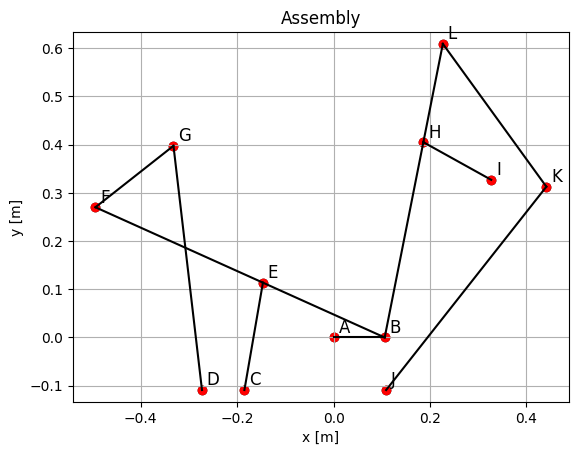

In [5]:
import matplotlib.pyplot as plt

# Solve for the angles and calculate the positions
angles = get_angles(theta_2[0], *geometry_parameters, theta_3_init, theta_4_init, theta_5_init, theta_6_init, theta_7_init, theta_8_init, theta_9_init, theta_10_init)
positions, positions_control = get_positions(theta_2[0], *angles, *geometry_parameters)
joints = dict(zip("ABCDEFGHIJKL", positions))

# Define the connections
connections = [("A", "B"), ("B", "E"), ("E", "C"), ("E", "F"), ("F", "G"), ("G", "D"), ("B", "H"), ("I", "H"), ("J", "K"), ("H", "L"), ("K", "L")]

plt.close('all')
plt.figure()

# Plot the points
plt.scatter(positions[:, 0], positions[:, 1], c="black")
plt.scatter(positions_control[:, 0], positions_control[:, 1], c="red")

# Plot the connections
for start, end in connections:
    start_point = joints.get(start)
    end_point = joints.get(end)
    plt.plot([start_point[0], end_point[0]], [start_point[1], end_point[1]], 'k-')

# Add text labels for left assembly points
for key in ("A", "B", "C", "D", "E", "F", "G", "H", "I", "J", "K", "L"):
    point = joints.get(key)
    plt.text(point[0] + 0.01, point[1] + 0.01, key, fontsize=12, ha='left')

plt.xlabel('x [m]')
plt.ylabel('y [m]')
plt.title('Assembly')
plt.axis('equal')
plt.grid(True)
plt.show()

### Velocity analysis

In [6]:
# Define function that solves the angular velocity for the unknown angles theta_3 to theta_10
def get_angular_velocity(theta_2, theta_3, theta_4, theta_5, theta_6, theta_7, theta_8, theta_9, theta_10,
                         dtheta_2,
                         r2, r3, r31, r32, r4, r5, r6, r7, r71, r72, r8, r9, r10):

    # A contains the derivatives of the loop closure equations
    A = np.array([[-r31 * np.sin(theta_3), r4 * np.sin(theta_4), 0, 0, 0, 0, 0, 0],
                  [r31 * np.cos(theta_3), -r4 * np.cos(theta_4), 0, 0, 0, 0, 0, 0],
                  [-r32 * np.sin(theta_3), -r4 * np.sin(theta_4), r5 * np.sin(theta_5), -r6 * np.sin(theta_6), 0, 0, 0, 0],
                  [r32 * np.cos(theta_3), r4 * np.cos(theta_4), -r5 * np.cos(theta_5), r6 * np.cos(theta_6), 0, 0, 0, 0],
                  [0, 0, 0, 0, -r71 * np.sin(theta_7), r8 * np.sin(theta_8), 0, 0],
                  [0, 0, 0, 0, r71 * np.cos(theta_7), -r8 * np.cos(theta_8), 0, 0],
                  [0, 0, 0, 0, -r7 * np.sin(theta_7), 0, r9 * np.sin(theta_9), r10 * np.sin(theta_10)],
                  [0, 0, 0, 0, r7 * np.cos(theta_7), 0, -r9 * np.cos(theta_9), -r10 * np.cos(theta_10)]])

    # B contains the known driving velocities of theta_2
    B = np.array([r2 * np.sin(theta_2) * dtheta_2,
                  -r2 * np.cos(theta_2) * dtheta_2,
                  0,
                  0,
                  r2 * np.sin(theta_2) * dtheta_2,
                  -r2 * np.cos(theta_2) * dtheta_2,
                  r2 * np.sin(theta_2) * dtheta_2,
                  -r2 * np.cos(theta_2) * dtheta_2])

    x = np.linalg.solve(A, B)
    return x # Returns dtheta_3 to dtheta_10

# Define function that computes the linear velocity of the joints A to L
def get_linear_velocity(theta_2, theta_3, theta_4, theta_5, theta_6, theta_7, theta_8, theta_9, theta_10,
                        dtheta_2, dtheta_3, dtheta_4, dtheta_5, dtheta_6, dtheta_7, dtheta_8, dtheta_9, dtheta_10,
                        r2, r3, r31, r32, r4, r5, r6, r7, r71, r72, r8, r9, r10):

    # Compute the velocity of joints A to L (everything is calculated from fixed joint A)
    v_A = np.array([0, 0, 0])
    v_B = v_A + np.cross([0, 0, dtheta_2], [*rotate_vector([r2, 0], theta_2), 0])
    v_C = np.array([0, 0, 0])
    v_D = np.array([0, 0, 0])
    v_E = v_B + np.cross([0, 0, dtheta_3], [*rotate_vector([r31, 0], theta_3), 0])
    v_F = v_B + np.cross([0, 0, dtheta_3], [*rotate_vector([r3, 0], theta_3), 0])
    v_G = v_F + np.cross([0, 0, dtheta_6], [*rotate_vector([r6, 0], theta_6), 0])
    v_H = v_B + np.cross([0, 0, dtheta_7], [*rotate_vector([r71, 0], theta_7), 0])
    v_I = np.array([0, 0, 0])
    v_J = np.array([0, 0, 0])
    v_L = v_B + np.cross([0, 0, dtheta_7], [*rotate_vector([r7, 0], theta_7), 0])
    v_K = v_L + np.cross([0, 0, dtheta_10], [*rotate_vector([-r10, 0], theta_10), 0])

    # Control velocities (everything is calculated from fixed joint D and J)
    v_G_control = v_D + np.cross([0, 0, dtheta_5], [*rotate_vector([r5, 0], theta_5), 0])
    v_F_control = v_G_control + np.cross([0, 0, dtheta_6], [*rotate_vector([-r6, 0], theta_6), 0])
    v_E_control = v_F_control + np.cross([0, 0, dtheta_3], [*rotate_vector([-r32, 0], theta_3), 0])
    v_B_control = v_F_control + np.cross([0, 0, dtheta_3], [*rotate_vector([-r3, 0], theta_3), 0])
    v_K_control = v_J + np.cross([0, 0, dtheta_9], [*rotate_vector([r9, 0], theta_9), 0])
    v_L_control = v_K_control + np.cross([0, 0, dtheta_10], [*rotate_vector([r10, 0], theta_10), 0])
    v_H_control = v_L_control + np.cross([0, 0, dtheta_7], [*rotate_vector([-r72, 0], theta_7), 0])

    # Returns velocities of joints A to L and the control velocities
    return (np.array([v[:2] for v in (v_A, v_B, v_C, v_D, v_E, v_F, v_G, v_H, v_I, v_J, v_K, v_L)]),
            np.array([v[:2] for v in (v_A, v_B_control, v_C, v_D, v_E_control, v_F_control, v_G_control, v_H_control, v_I, v_J, v_K_control, v_L_control)]))

### Acceleration analysis

In [7]:
# Define function that solves the angular acceleration for the unknown angles theta_3 to theta_10
def get_angular_acceleration(theta_2, theta_3, theta_4, theta_5, theta_6, theta_7, theta_8, theta_9, theta_10,
                             dtheta_2, dtheta_3, dtheta_4, dtheta_5, dtheta_6, dtheta_7, dtheta_8, dtheta_9, dtheta_10,
                             ddtheta_2,
                             r2, r3, r31, r32, r4, r5, r6, r7, r71, r72, r8, r9, r10):

    # A contains the derivatives of the angular velocity equations
    A = np.array([[-r31 * np.sin(theta_3), r4 * np.sin(theta_4), 0, 0, 0, 0, 0, 0],
                  [r31 * np.cos(theta_3), -r4 * np.cos(theta_4), 0, 0, 0, 0, 0, 0],
                  [-r32 * np.sin(theta_3), -r4 * np.sin(theta_4), r5 * np.sin(theta_5), -r6 * np.sin(theta_6), 0, 0, 0, 0],
                  [r32 * np.cos(theta_3), r4 * np.cos(theta_4), -r5 * np.cos(theta_5), r6 * np.cos(theta_6), 0, 0, 0, 0],
                  [0, 0, 0, 0, -r71 * np.sin(theta_7), r8 * np.sin(theta_8), 0, 0],
                  [0, 0, 0, 0, r71 * np.cos(theta_7), -r8 * np.cos(theta_8), 0, 0],
                  [0, 0, 0, 0, -r7 * np.sin(theta_7), 0, r9 * np.sin(theta_9), r10 * np.sin(theta_10)],
                  [0, 0, 0, 0, r7 * np.cos(theta_7), 0, -r9 * np.cos(theta_9), -r10 * np.cos(theta_10)]])

    # B contains the other known factors in terms of the angular velocities
    B = np.array([r2 * np.sin(theta_2) * ddtheta_2 + r2 * np.cos(theta_2) * dtheta_2**2 + r31 * np.cos(theta_3) * dtheta_3**2 - r4 * np.cos(theta_4) * dtheta_4**2,
                  -r2 * np.cos(theta_2) * ddtheta_2 + r2 * np.sin(theta_2) * dtheta_2**2 + r31 * np.sin(theta_3) * dtheta_3**2 - r4 * np.sin(theta_4) * dtheta_4**2,
                  r32 * np.cos(theta_3) * dtheta_3**2 + r4 * np.cos(theta_4) * dtheta_4**2 - r5 * np.cos(theta_5) * dtheta_5**2 + r6 * np.cos(theta_6) * dtheta_6**2,
                  r32 * np.sin(theta_3) * dtheta_3**2 + r4 * np.sin(theta_4) * dtheta_4**2 - r5 * np.sin(theta_5) * dtheta_5**2 + r6 * np.sin(theta_6) * dtheta_6**2,
                  r2 * np.sin(theta_2) * ddtheta_2 + r2 * np.cos(theta_2) * dtheta_2**2 + r71 * np.cos(theta_7) * dtheta_7**2 - r8 * np.cos(theta_8) * dtheta_8**2,
                  -r2 * np.cos(theta_2) * ddtheta_2 + r2 * np.sin(theta_2) * dtheta_2**2 + r71 * np.sin(theta_7) * dtheta_7**2 - r8 * np.sin(theta_8) * dtheta_8**2,
                  r2 * np.sin(theta_2) * ddtheta_2 + r2 * np.cos(theta_2) * dtheta_2**2 + r7 * np.cos(theta_7) * dtheta_7**2 - r10 * np.cos(theta_10) * dtheta_10**2 - r9 * np.cos(theta_9) * dtheta_9**2,
                  -r2 * np.cos(theta_2) * ddtheta_2 + r2 * np.sin(theta_2) * dtheta_2**2 + r7 * np.sin(theta_7) * dtheta_7**2 - r10 * np.sin(theta_10) * dtheta_10**2 - r9 * np.sin(theta_9) * dtheta_9**2])

    x = np.linalg.solve(A, B)
    return x # Returns ddtheta_3 to ddtheta_10

# Define function that computes the linear acceleration of the joints A to L
def get_linear_acceleration(theta_2, theta_3, theta_4, theta_5, theta_6, theta_7, theta_8, theta_9, theta_10,
                            dtheta_2, dtheta_3, dtheta_4, dtheta_5, dtheta_6, dtheta_7, dtheta_8, dtheta_9, dtheta_10,
                            ddtheta_2, ddtheta_3, ddtheta_4, ddtheta_5, ddtheta_6, ddtheta_7, ddtheta_8, ddtheta_9, ddtheta_10,
                            r2, r3, r31, r32, r4, r5, r6, r7, r71, r72, r8, r9, r10):
    # Compute the acceleration of joints A to L (everything is calculated from fixed joint A)
    a_A = np.array([0, 0, 0])
    a_B = a_A + np.cross([0, 0, ddtheta_2], [*rotate_vector([r2, 0], theta_2), 0]) + np.cross([0, 0, dtheta_2], np.cross([0, 0, dtheta_2], [*rotate_vector([r2, 0], theta_2), 0]))
    a_C = np.array([0, 0, 0])
    a_D = np.array([0, 0, 0])
    a_E = a_B + np.cross([0, 0, ddtheta_3], [*rotate_vector([r31, 0], theta_3), 0]) + np.cross([0, 0, dtheta_3], np.cross([0, 0, dtheta_3], [*rotate_vector([r31, 0], theta_3), 0]))
    a_F = a_B + np.cross([0, 0, ddtheta_3], [*rotate_vector([r3, 0], theta_3), 0]) + np.cross([0, 0, dtheta_3], np.cross([0, 0, dtheta_3], [*rotate_vector([r3, 0], theta_3), 0]))
    a_G = a_F + np.cross([0, 0, ddtheta_6], [*rotate_vector([r6, 0], theta_6), 0]) + np.cross([0, 0, dtheta_6], np.cross([0, 0, dtheta_6], [*rotate_vector([r6, 0], theta_6), 0]))
    a_H = a_B + np.cross([0, 0, ddtheta_7], [*rotate_vector([r71, 0], theta_7), 0]) + np.cross([0, 0, dtheta_7], np.cross([0, 0, dtheta_7], [*rotate_vector([r71, 0], theta_7), 0]))
    a_I = np.array([0, 0, 0])
    a_J = np.array([0, 0, 0])
    a_L = a_B + np.cross([0, 0, ddtheta_7], [*rotate_vector([r7, 0], theta_7), 0]) + np.cross([0, 0, dtheta_7], np.cross([0, 0, dtheta_7], [*rotate_vector([r7, 0], theta_7), 0]))
    a_K = a_L + np.cross([0, 0, ddtheta_10], [*rotate_vector([-r10, 0], theta_10), 0]) + np.cross([0, 0, dtheta_10], np.cross([0, 0, dtheta_10], [*rotate_vector([-r10, 0], theta_10), 0]))

    # Control accelerations (everything is calculated from fixed joint D and J)
    a_G_control = a_D + np.cross([0, 0, ddtheta_5], [*rotate_vector([r5, 0], theta_5), 0]) + np.cross([0, 0, dtheta_5], np.cross([0, 0, dtheta_5], [*rotate_vector([r5, 0], theta_5), 0]))
    a_F_control = a_G_control + np.cross([0, 0, ddtheta_6], [*rotate_vector([-r6, 0], theta_6), 0]) + np.cross([0, 0, dtheta_6], np.cross([0, 0, dtheta_6], [*rotate_vector([-r6, 0], theta_6), 0]))
    a_E_control = a_F_control + np.cross([0, 0, ddtheta_3], [*rotate_vector([-r32, 0], theta_3), 0]) + np.cross([0, 0, dtheta_3], np.cross([0, 0, dtheta_3], [*rotate_vector([-r32, 0], theta_3), 0]))
    a_B_control = a_F_control + np.cross([0, 0, ddtheta_3], [*rotate_vector([-r3, 0], theta_3), 0]) + np.cross([0, 0, dtheta_3], np.cross([0, 0, dtheta_3], [*rotate_vector([-r3, 0], theta_3), 0]))
    a_K_control = a_J + np.cross([0, 0, ddtheta_9], [*rotate_vector([r9, 0], theta_9), 0]) + np.cross([0, 0, dtheta_9], np.cross([0, 0, dtheta_9], [*rotate_vector([r9, 0], theta_9), 0]))
    a_L_control = a_K_control + np.cross([0, 0, ddtheta_10], [*rotate_vector([r10, 0], theta_10), 0]) + np.cross([0, 0, dtheta_10], np.cross([0, 0, dtheta_10], [*rotate_vector([r10, 0], theta_10), 0]))
    a_H_control = a_L_control + np.cross([0, 0, ddtheta_7], [*rotate_vector([-r72, 0], theta_7), 0]) + np.cross([0, 0, dtheta_7], np.cross([0, 0, dtheta_7], [*rotate_vector([-r72, 0], theta_7), 0]))

    # Returns accelerations of joints A to L and the control accelerations
    return (np.array([a[:2] for a in (a_A, a_B, a_C, a_D, a_E, a_F, a_G, a_H, a_I, a_J, a_K, a_L)]),
            np.array([a[:2] for a in (a_A, a_B_control, a_C, a_D, a_E_control, a_F_control, a_G_control, a_H_control, a_I, a_J, a_K_control, a_L_control)]))

Now we can compute all variables for the whole motion of the mechanism for **each moment in time**:
- the angle of each bar,
- the position of each joint,
- the angular velocity of each bar,
- the linear velocity of each joint,
- the angular acceleration of each bar,
- the linear acceleration of each join,
- control checks for the position, velocity and acceleration of each joint.

In [8]:
# Calculates angles, velocities and accelerations for later use
angles = np.zeros((len(theta_2), 8)) # Stores angles theta_3 to theta_10
positions = np.zeros((len(theta_2), 12, 2)) # Stores positions of joints A to L
positions_control = np.zeros((len(theta_2), 12, 2))
joints = dict((("ABCDEFGHIJKL"[i], positions[:, i, :]) for i in range(12)))

angular_velocities = np.zeros((len(theta_2), 8)) # Stores angular velocities dtheta_3 to dtheta_10
linear_velocities = np.zeros((len(theta_2), 12, 2)) # Stores linear velocities of joints A to L
linear_velocities_control = np.zeros((len(theta_2), 12, 2))

angular_accelerations = np.zeros((len(theta_2), 8)) # Stores angular accelerations ddtheta_3 to ddtheta_10
linear_accelerations = np.zeros((len(theta_2), 12, 2)) # Stores linear accelerations of joints A to L
linear_accelerations_control = np.zeros((len(theta_2), 12, 2))

# Computes the complete kinematics of the mechanism
for i in range(len(theta_2)):
    angles[i] = get_angles(theta_2[i], *geometry_parameters, theta_3_init, theta_4_init, theta_5_init, theta_6_init, theta_7_init, theta_8_init, theta_9_init, theta_10_init)
    positions[i], positions_control[i] = get_positions(theta_2[i], *angles[i], *geometry_parameters)

    angular_velocities[i] = get_angular_velocity(theta_2[i], *angles[i], dtheta_2[i], *link_parameters)
    linear_velocities[i], linear_velocities_control[i] = get_linear_velocity(theta_2[i], *angles[i], dtheta_2[i], *angular_velocities[i], *link_parameters)

    angular_accelerations[i] = get_angular_acceleration(theta_2[i], *angles[i], dtheta_2[i], *angular_velocities[i], ddtheta_2[i], *link_parameters)
    linear_accelerations[i], linear_accelerations_control[i] = get_linear_acceleration(theta_2[i], *angles[i], dtheta_2[i], *angular_velocities[i], ddtheta_2[i], *angular_accelerations[i], *link_parameters)

theta_3, dtheta_3, ddtheta_3 = angles[:, 0], angular_velocities[:, 0], angular_accelerations[:, 0]
theta_4, dtheta_4, ddtheta_4 = angles[:, 1], angular_velocities[:, 1], angular_accelerations[:, 1]
theta_5, dtheta_5, ddtheta_5 = angles[:, 2], angular_velocities[:, 2], angular_accelerations[:, 2]
theta_6, dtheta_6, ddtheta_6 = angles[:, 3], angular_velocities[:, 3], angular_accelerations[:, 3]
theta_7, dtheta_7, ddtheta_7 = angles[:, 4], angular_velocities[:, 4], angular_accelerations[:, 4]
theta_8, dtheta_8, ddtheta_8 = angles[:, 5], angular_velocities[:, 5], angular_accelerations[:, 5]
theta_9, dtheta_9, ddtheta_9 = angles[:, 6], angular_velocities[:, 6], angular_accelerations[:, 6]
theta_10, dtheta_10, ddtheta_10 = angles[:, 7], angular_velocities[:, 7], angular_accelerations[:, 7]

### Plots
We can make an animation of the mechanism and visualize the velocity vectors at the joints of the mechanism.
- The scale of the linear velocity vectors is multiplier by 2 to make the animation clearer.
- At around $t=8$s, the mechanism seems to be in a dead configuration. We will have to keep an eye on that and possibly mitigate the effects.
- The velocities of the left part of the mechanism become quite large starting from around $t=6$s.

In [9]:
import matplotlib.animation
import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150
plt.ioff()
fig, ax = plt.subplots()

def animate(i):
    # Transform to real index
    i *= len(t) // 50

    plt.cla()
    assembly = positions[i]

    # Plot the connections
    for start, end in connections:
        start_point = joints[start][i]
        end_point = joints[end][i]
        plt.plot([start_point[0], end_point[0]], [start_point[1], end_point[1]], 'k-')

    # Plot velocity vectors at each joint
    for j, joint in enumerate(joints.keys()):
        plt.quiver(assembly[j, 0], assembly[j, 1], linear_velocities[i][j][0], linear_velocities[i][j][1], angles='xy', scale_units='xy', scale=0.5, color='red')

    # Plot the joint positions
    plt.scatter(assembly[:, 0], assembly[:, 1], c="black")

    # Add text labels for left assembly points
    for key in ("A", "B", "C", "D", "E", "F", "G", "H", "I", "J", "K", "L"):
        point = joints.get(key)
        plt.text(point[i, 0] + 0.01, point[i, 1] + 0.01, key, fontsize=12, ha='left')

    plt.xlabel('x [m]')
    plt.ylabel('y [m]')
    plt.title(r'$\theta_2$ = {:.2f} deg; $t$ = {:.2f} s'.format(theta_2[i]*180/np.pi, t[i]))
    # plt.axis('equal')
    plt.grid(True)
    plt.xlim(-1.1, 0.9)
    plt.ylim(-0.35, 0.9)

matplotlib.animation.FuncAnimation(fig, animate, frames=range(50), interval=Ts*2000)

#### Position plots

##### Errors on position calculations

- The validity of the position calculation was checked by calculating the position of a joint in two different ways.
- This is achieved by essentially picking a different 'chain' of relative velocities: start from a fixed joint (e.g. A) and work your way to the other joints using $p_\text{Y} = p_{\text{abs},X} + p_{\text{rel},XY}$.

**Accuracy of the errors**
- The position checks use two different vector chains to compute the same joint position, both relying on angles found by SciPy's `fsolve`.
- `fsolve` solves a non-linear system, which is inherently less precise than direct (linear) solvers due to iterative approximation and convergence tolerances.
- The angles returned by `fsolve` are only accurate up to a certain tolerance (default is usually around $10^{-8}$), so small discrepancies propagate into the calculated positions.
- Relative errors are slightly larger than absolute errors (around 1E-9) because the absolute errors are divided by the (small) position values, amplifying the ratio.
- These error levels are normal for non-linear numerical solvers and indicate that the solution is accurate within the expected limits of floating-point and solver tolerance.

/var/folders/tf/c1hx5x6s2_b4jflzst_zd7t80000gn/T/ipykernel_20291/2120373286.py:9: RuntimeWarning: divide by zero encountered in divide
  relative_errors = np.abs(absolute_errors / positions[:, index, :])


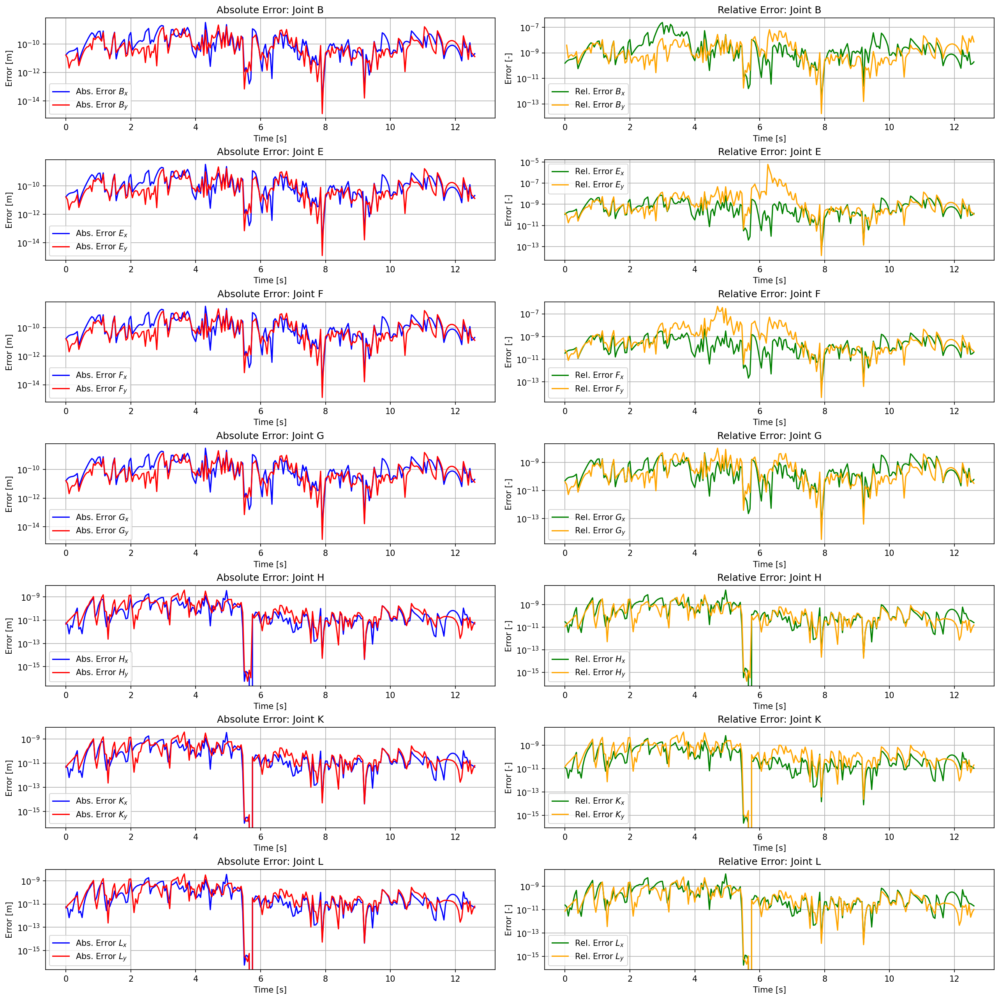

In [10]:
# Create subplots for absolute and relative errors
plt.close('all')
fig, axes = plt.subplots(7, 2, figsize=(17, 17), constrained_layout=True)
axes = axes.flatten()

for i, joint in enumerate(['B', 'E', 'F', 'G', 'H', 'K', 'L']):
    index = "ABCDEFGHIJKL".index(joint)
    absolute_errors = np.abs(positions[:, index, :] - positions_control[:, index, :])
    relative_errors = np.abs(absolute_errors / positions[:, index, :])

    # Absolute error plots
    axes[2 * i].plot(t, absolute_errors[:, 0], label=f'Abs. Error ${joint}_x$', color='blue')
    axes[2 * i].plot(t, absolute_errors[:, 1], label=f'Abs. Error ${joint}_y$', color='red')
    axes[2 * i].set_title(f'Absolute Error: Joint {joint}')
    axes[2 * i].set_xlabel('Time [s]')
    axes[2 * i].set_ylabel('Error [m]')
    axes[2 * i].set_yscale('log')  # Logarithmic scale for better visualization
    axes[2 * i].grid(True)
    axes[2 * i].legend()

    # Relative error plots
    axes[2 * i + 1].plot(t, relative_errors[:, 0], label=f'Rel. Error ${joint}_x$', color='green')
    axes[2 * i + 1].plot(t, relative_errors[:, 1], label=f'Rel. Error ${joint}_y$', color='orange')
    axes[2 * i + 1].set_title(f'Relative Error: Joint {joint}')
    axes[2 * i + 1].set_xlabel('Time [s]')
    axes[2 * i + 1].set_ylabel('Error [-]')
    axes[2 * i + 1].set_yscale('log')  # Logarithmic scale for better visualization
    axes[2 * i + 1].grid(True)
    axes[2 * i + 1].legend()

plt.show()

#### Angular velocity plots

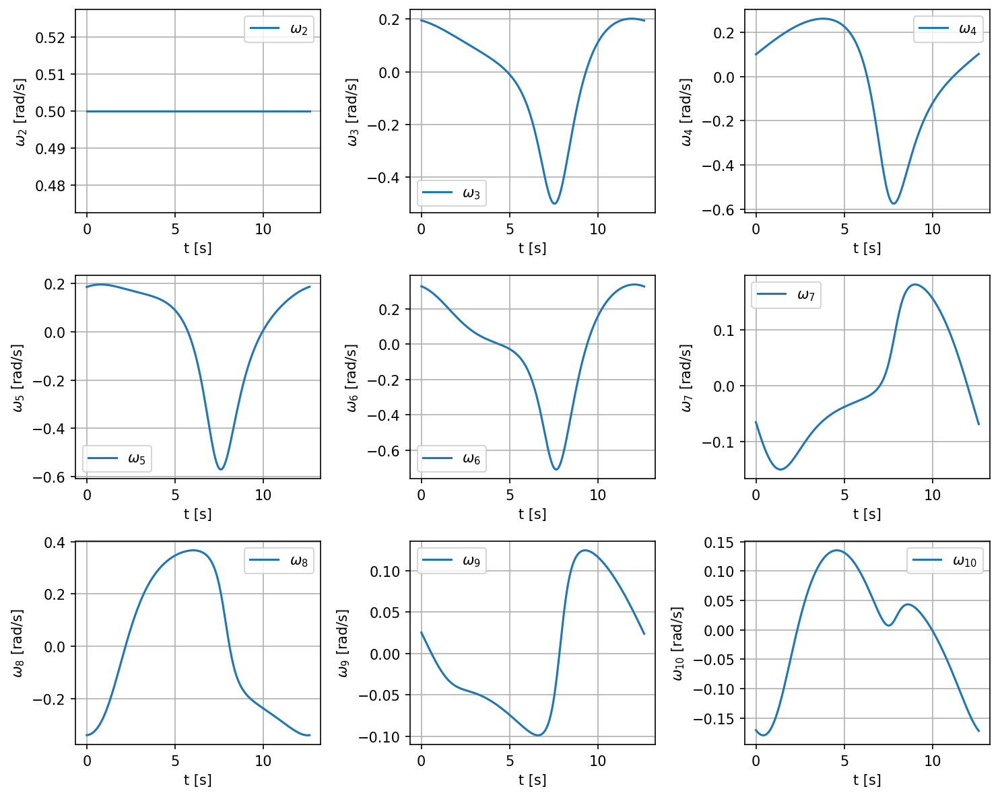

In [11]:
# Plot angular velocities with respect to time in subplots
plt.close('all')
plt.ion()
plt.figure(figsize=(10, 8))

# Angular velocities for linkages 2 to 10
dtheta_packed = [dtheta_2, dtheta_3, dtheta_4, dtheta_5, dtheta_6, dtheta_7, dtheta_8, dtheta_9, dtheta_10]
labels = [r'$\omega_2$', r'$\omega_3$', r'$\omega_4$', r'$\omega_5$', r'$\omega_6$',
          r'$\omega_7$', r'$\omega_8$', r'$\omega_9$', r'$\omega_{10}$']

# Create subplots
for i, (dtheta, label) in enumerate(zip(dtheta_packed, labels), start=1):
    plt.subplot(3, 3, i)
    plt.plot(t, dtheta, label=label)
    plt.ylabel(f'{label} [rad/s]')
    plt.xlabel('t [s]')
    plt.grid(True)
    plt.legend()

plt.tight_layout()
plt.show()

#### Linear velocity plots

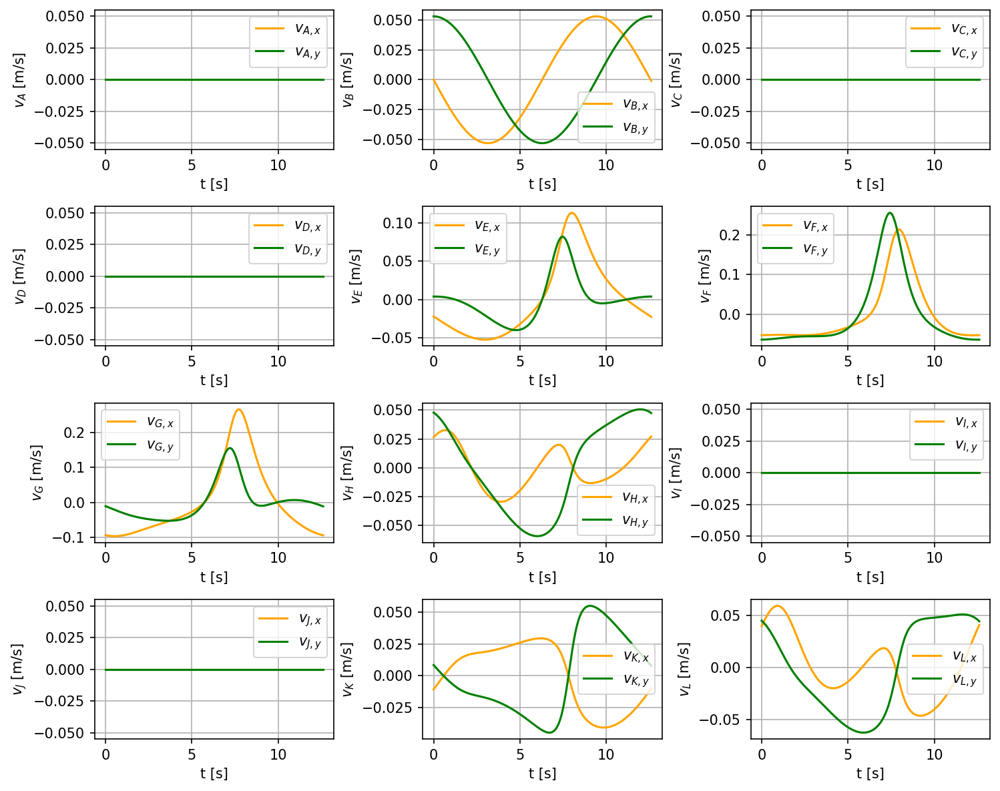

In [12]:
# Plot linear velocities with respect to time in subplots
plt.close('all')
plt.ion()
plt.figure(figsize=(10, 8))

# Linear velocities for joints G and K
v_packed = [(linear_velocities[:, i, :], joint) for i, joint in enumerate("ABCDEFGHIJKL")]

# Create subplots
for i, (v, label) in enumerate(v_packed, start=1):
    plt.subplot((len(v_packed) + 2) // 3, 3, i)  # 3 subplots per line
    plt.plot(t, v[:, 0], label='$v_{' + label + ',x}$', color='orange')  # x-axis in orange
    plt.plot(t, v[:, 1], label='$v_{' + label + ',y}$', color='green')   # y-axis in green
    plt.ylabel(f'$v_{label}$ [m/s]')
    plt.xlabel('t [s]')
    plt.grid(True)
    plt.legend()

plt.tight_layout()
plt.show()


##### Errors on linear velocity calculations

- The validity of the linear velocity calculation was checked by calculating the linear velocity of a joint in two different ways.
- This is achieved by essentially picking a different 'chain' of relative velocities: start from a fixed joint (e.g. A) and work your way to the other joints using $v_\text{Y} = v_{\text{abs},X} + v_{\text{rel},XY}$.

**Accuracy of the errors**
- The linear velocities are calculated using a vector chain. The calculations make use of the angular velocities found by solving a **linear system of equations**.
- Such a small system of equations can be solved **directly** by a solving algorithm. The results are **exact** if we ignore floating-point rounding errors.
- Absolute errors in velocity validation are often exactly zero due to identical floating-point results when both vector chains follow the same computational path.
- Small nonzero errors (typically $10^{-18}$ to $10^{-16}$) are caused by floating-point rounding and the order of arithmetic operations.
- These errors are expected and indicate that the two calculation methods are mathematically equivalent and numerically stable.
- Exact zeros occur more frequently at symmetric or "simple" mechanism configurations, where calculations align perfectly.
- The observed error levels confirm the correctness and high numerical accuracy of the kinematic implementation.

/var/folders/tf/c1hx5x6s2_b4jflzst_zd7t80000gn/T/ipykernel_20291/881366053.py:9: RuntimeWarning: invalid value encountered in divide
  relative_errors = np.abs(absolute_errors / linear_velocities[:, index, :])


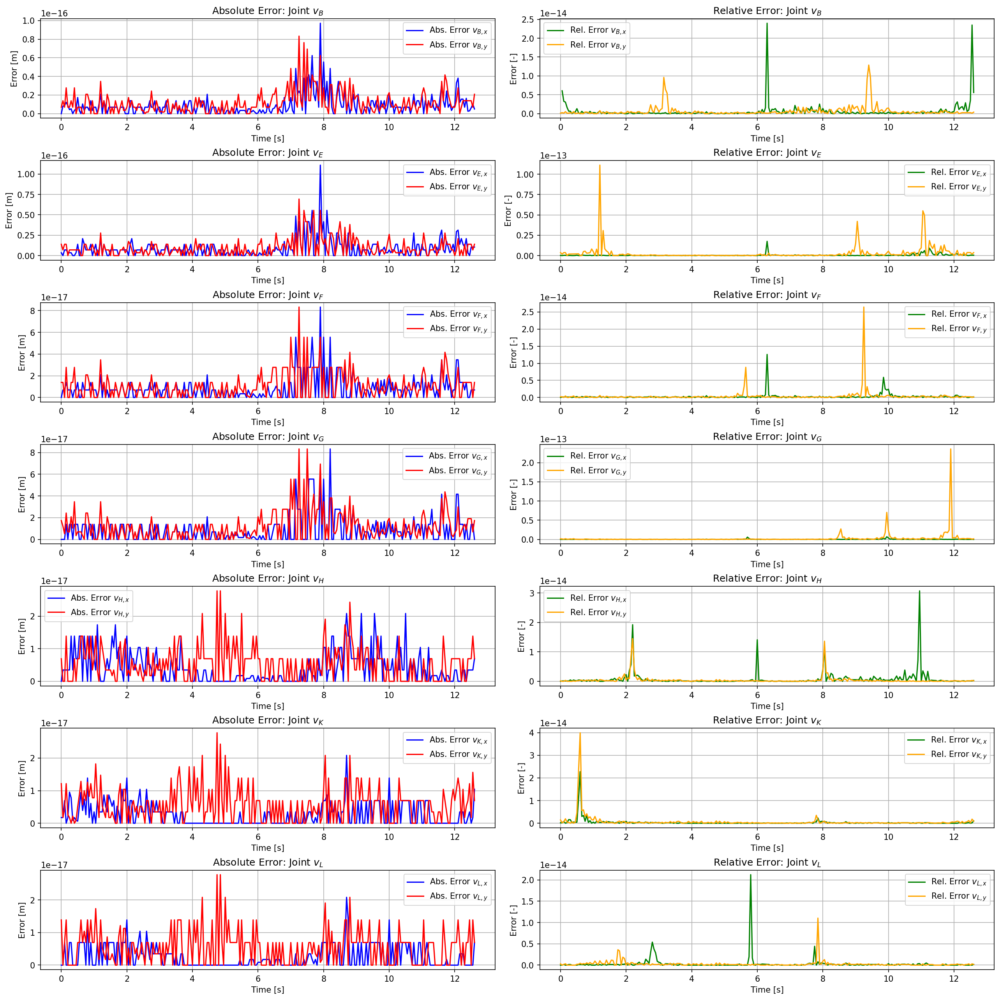

In [13]:
# Create subplots for absolute and relative errors
plt.close('all')
fig, axes = plt.subplots(7, 2, figsize=(17, 17), constrained_layout=True)
axes = axes.flatten()

for i, joint in enumerate(['B', 'E', 'F', 'G', 'H', 'K', 'L']):
    index = "ABCDEFGHIJKL".index(joint)
    absolute_errors = np.abs(linear_velocities[:, index, :] - linear_velocities_control[:, index, :])
    relative_errors = np.abs(absolute_errors / linear_velocities[:, index, :])

    # Absolute error plots
    axes[2 * i].plot(t, absolute_errors[:, 0], label='Abs. Error $v_{' + joint + ',x}$', color='blue')
    axes[2 * i].plot(t, absolute_errors[:, 1], label='Abs. Error $v_{' + joint + ',y}$', color='red')
    axes[2 * i].set_title('Absolute Error: Joint $v_{' + joint + '}$')
    axes[2 * i].set_xlabel('Time [s]')
    axes[2 * i].set_ylabel('Error [m]')
    # axes[2 * i].set_yscale('log')  # Logarithmic scale for better visualization
    axes[2 * i].grid(True)
    axes[2 * i].legend()

    # Relative error plots
    axes[2 * i + 1].plot(t, relative_errors[:, 0], label='Rel. Error $v_{' + joint + ',x}$', color='green')
    axes[2 * i + 1].plot(t, relative_errors[:, 1], label='Rel. Error $v_{' + joint + ',y}$', color='orange')
    axes[2 * i + 1].set_title('Relative Error: Joint $v_{' + joint + '}$')
    axes[2 * i + 1].set_xlabel('Time [s]')
    axes[2 * i + 1].set_ylabel('Error [-]')
    # axes[2 * i + 1].set_yscale('log')  # Logarithmic scale for better visualization
    axes[2 * i + 1].grid(True)
    axes[2 * i + 1].legend()

plt.show()

#### Angular acceleration plots

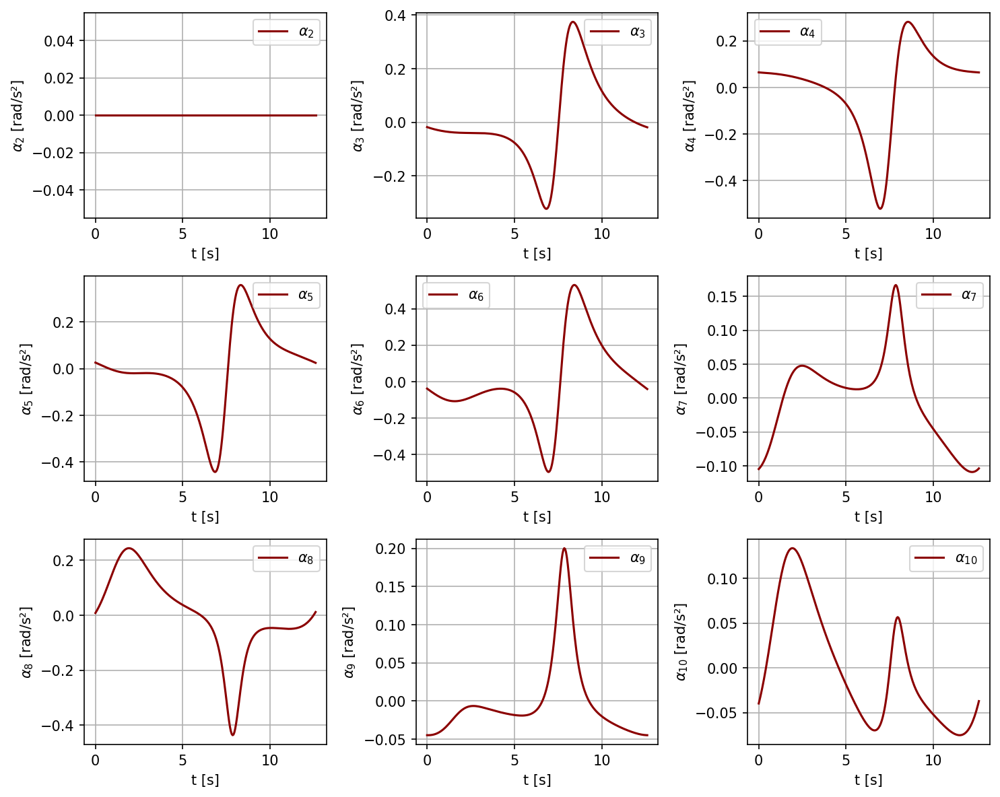

In [14]:
# Plot angular accelerations with respect to time in subplots
plt.close('all')
plt.ion()
plt.figure(figsize=(10, 8))

# Angular accelerations for linkages 2 to 10
ddtheta_packed = [ddtheta_2, ddtheta_3, ddtheta_4, ddtheta_5, ddtheta_6, ddtheta_7, ddtheta_8, ddtheta_9, ddtheta_10]
labels = [r'$\alpha_2$', r'$\alpha_3$', r'$\alpha_4$', r'$\alpha_5$', r'$\alpha_6$',
          r'$\alpha_7$', r'$\alpha_8$', r'$\alpha_9$', r'$\alpha_{10}$']

# Create subplots
for i, (ddtheta, label) in enumerate(zip(ddtheta_packed, labels), start=1):
    plt.subplot(3, 3, i)
    plt.plot(t, ddtheta, label=label, color='darkred')
    plt.ylabel(f'{label} [rad/s²]')
    plt.xlabel('t [s]')
    plt.grid(True)
    plt.legend()

plt.tight_layout()
plt.show()

#### Linear acceleration plots

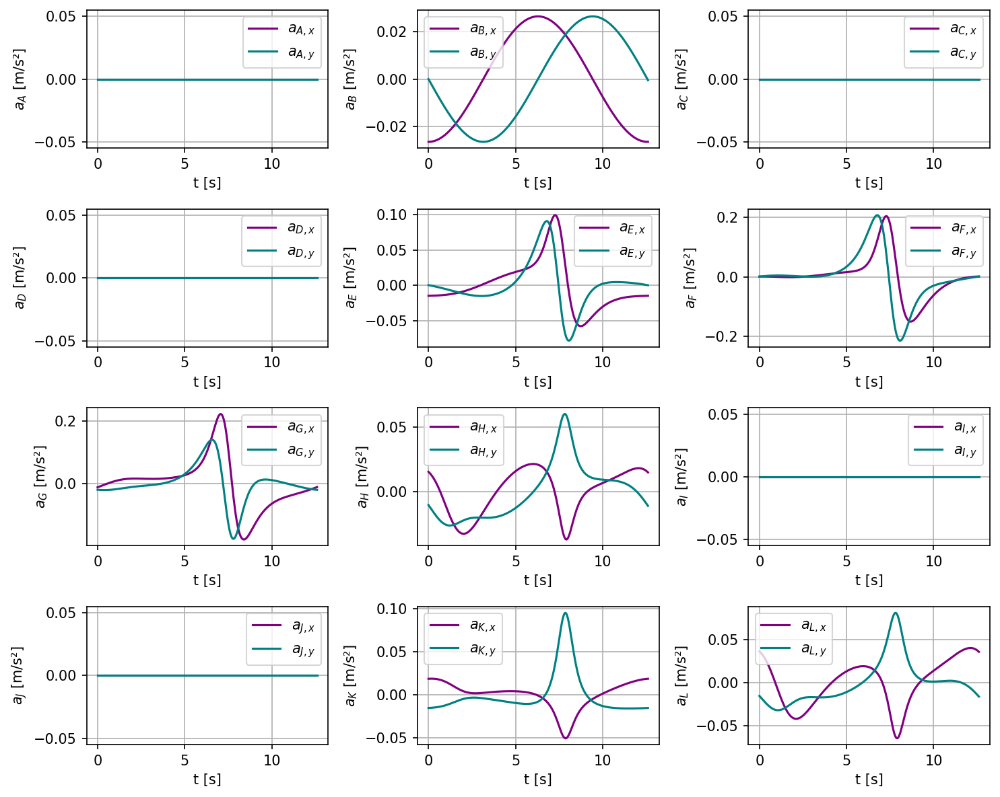

In [15]:
# Plot linear accelerations with respect to time in subplots
plt.close('all')
plt.ion()
plt.figure(figsize=(10, 8))

# Linear accelerations for joints
a_packed = [(linear_accelerations[:, i, :], joint) for i, joint in enumerate("ABCDEFGHIJKL")]

# Create subplots
for i, (a, label) in enumerate(a_packed, start=1):
    plt.subplot((len(a_packed) + 2) // 3, 3, i)  # 3 subplots per line
    plt.plot(t, a[:, 0], label='$a_{' + label + ',x}$', color='purple')  # x-axis in purple
    plt.plot(t, a[:, 1], label='$a_{' + label + ',y}$', color='teal')    # y-axis in teal
    plt.ylabel(f'$a_{label}$ [m/s²]')
    plt.xlabel('t [s]')
    plt.grid(True)
    plt.legend()

plt.tight_layout()
plt.show()

##### Errors on linear acceleration calculations

- The validity of the linear acceleration calculation was checked by calculating the linear acceleration of a joint in two different ways.
- This is achieved by essentially picking a different 'chain' of relative velocities: start from a fixed joint (e.g. A) and work your way to the other joints using relative accelerations, which makes calculations easier.

**Accuracy of the errors**
- The linear accelerations are calculated using a vector chain. The calculations make use of the angular velocities and accelerations found by solving **linear systems of equations**.
- Such a small system of equations can be solved **directly** by a solving algorithm. The results are **exact** if we ignore floating-point rounding errors.
- Absolute errors in acceleration validation are often exactly zero due to identical floating-point results when both vector chains follow the same computational path.
- Small nonzero errors (typically $10^{-18}$ to $10^{-16}$) are caused by floating-point rounding and the order of arithmetic operations.
- These errors are expected and indicate that the two calculation methods are mathematically equivalent and numerically stable.
- Exact zeros occur more frequently at symmetric or "simple" mechanism configurations, where calculations align perfectly.
- The observed error levels confirm the correctness and high numerical accuracy of the kinematic implementation.

/var/folders/tf/c1hx5x6s2_b4jflzst_zd7t80000gn/T/ipykernel_20291/2557131627.py:9: RuntimeWarning: divide by zero encountered in divide
  relative_errors = np.abs(absolute_errors / linear_accelerations[:, index, :])


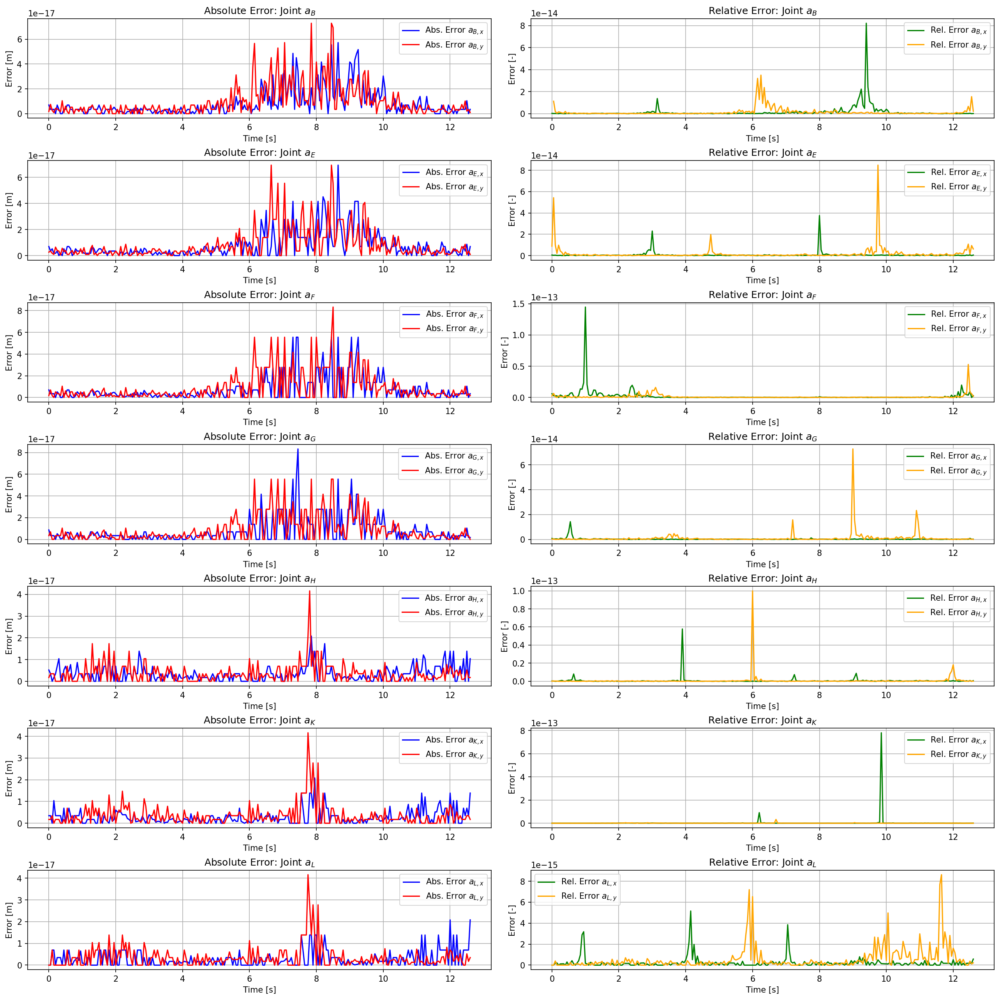

In [16]:
# Create subplots for absolute and relative errors
plt.close('all')
fig, axes = plt.subplots(7, 2, figsize=(17, 17), constrained_layout=True)
axes = axes.flatten()

for i, joint in enumerate(['B', 'E', 'F', 'G', 'H', 'K', 'L']):
    index = "ABCDEFGHIJKL".index(joint)
    absolute_errors = np.abs(linear_accelerations[:, index, :] - linear_accelerations_control[:, index, :])
    relative_errors = np.abs(absolute_errors / linear_accelerations[:, index, :])

    # Absolute error plots
    axes[2 * i].plot(t, absolute_errors[:, 0], label='Abs. Error $a_{' + joint + ',x}$', color='blue')
    axes[2 * i].plot(t, absolute_errors[:, 1], label='Abs. Error $a_{' + joint + ',y}$', color='red')
    axes[2 * i].set_title('Absolute Error: Joint $a_{' + joint + '}$')
    axes[2 * i].set_xlabel('Time [s]')
    axes[2 * i].set_ylabel('Error [m]')
    # axes[2 * i].set_yscale('log')  # Logarithmic scale for better visualization
    axes[2 * i].grid(True)
    axes[2 * i].legend()

    # Relative error plots
    axes[2 * i + 1].plot(t, relative_errors[:, 0], label='Rel. Error $a_{' + joint + ',x}$', color='green')
    axes[2 * i + 1].plot(t, relative_errors[:, 1], label='Rel. Error $a_{' + joint + ',y}$', color='orange')
    axes[2 * i + 1].set_title('Relative Error: Joint $a_{' + joint + '}$')
    axes[2 * i + 1].set_xlabel('Time [s]')
    axes[2 * i + 1].set_ylabel('Error [-]')
    # axes[2 * i + 1].set_yscale('log')  # Logarithmic scale for better visualization
    axes[2 * i + 1].grid(True)
    axes[2 * i + 1].legend()

plt.show()

## Dynamic analysis

The unknowns are:
- two reaction forces in each hinge (X and Y components),
- except in hinge B, where 3 bars are joined together (3 forces with 2 components each)
- The required driving torque.

For each of the bars we have the force/torque equilibrium:

$\sum F_x = ma_x$,

$\sum F_y = ma_y$,

$\sum M_z + \sum \vec{r} \times \vec{F} = I\alpha$.

There are 9 bars, and we have 29 equations in total to solve for the 29 unknowns.

Let's take a look at the free body diagrams of all the bars.

In [17]:
#<!-- ![alt text](Images/FBD.png "Free body diagram Bar 2") -->
#<img src="Images/Bar 2.png" alt="drawing" width="700"/>

In [18]:
#<!-- ![alt text](Images/FBD.png "Free body diagram Bar 3") -->
#<img src="Images/Bar 3.png" alt="drawing" width="700"/>

In [19]:
#<!-- ![alt text](Images/FBD.png "Free body diagram Bar 4") -->
#<img src="Images/Bar 4.png" alt="drawing" width="700"/>

In [20]:
#<!-- ![alt text](Images/FBD.png "Free body diagram Bar 5") -->
#<img src="Images/Bar 5.png" alt="drawing" width="700"/>

In [21]:
#<!-- ![alt text](Images/FBD.png "Free body diagram Bar 6") -->
#<img src="Images/Bar 6.png" alt="drawing" width="700"/>

In [22]:
#<!-- ![alt text](Images/FBD.png "Free body diagram Bar 7") -->
#<img src="Images/Bar 7.png" alt="drawing" width="700"/>

In [23]:
#<!-- ![alt text](Images/FBD.png "Free body diagram Bar 8") -->
#<img src="Images/Bar 8.png" alt="drawing" width="700"/>

In [24]:
#<!-- ![alt text](Images/FBD.png "Free body diagram Bar 9") -->
#<img src="Images/Bar 9.png" alt="drawing" width="700"/>

In [25]:
#<!-- ![alt text](Images/FBD.png "Free body diagram Bar 10") -->
#<img src="Images/Bar 10.png" alt="drawing" width="700"/>

We first represent al the known variables:

In [26]:
# Dynamic parameters, defined in a local frame on each of the bars.
# X coordinates of cog (centre of gravity)
X2 = r2 / 2
X3 = r3 / 2
X4 = r4 / 2
X5 = r5 / 2
X6 = r6 / 2
X7 = r7 / 2
X8 = r8 / 2
X9 = r9 / 2
X10 = r10 / 2

# Y coordinates of cog
Y2 = 0
Y3 = 0
Y4 = 0
Y5 = 0
Y6 = 0
Y7 = 0
Y8 = 0
Y9 = 0
Y10 = 0

# Mass of the bars
# m = density x length x surface (pi / 4 * (2cm)^2)
rho = 7800 # kg/m^3 (steel)
d = 0.02 # diameter in m
mass_per_length = rho * np.pi / 4 * d**2 # kg/m
m2 = r2 * mass_per_length
m3 = r3 * mass_per_length
m4 = r4 * mass_per_length
m5 = r5 * mass_per_length
m6 = r6 * mass_per_length
m7 = r7 * mass_per_length
m8 = r8 * mass_per_length
m9 = r9 * mass_per_length
m10 = r10 * mass_per_length

# Inertia of the bars
J2 = m2 * r2 ** 2 / 12
J3 = m3 * r3 ** 2 / 12
J4 = m4 * r4 ** 2 / 12
J5 = m5 * r5 ** 2 / 12
J6 = m6 * r6 ** 2 / 12
J7 = m7 * r7 ** 2 / 12
J8 = m8 * r8 ** 2 / 12
J9 = m9 * r9 ** 2 / 12
J10 = m10 * r10 ** 2 / 12

# Define vectors from the center of gravity of each bar to point A, B, C, D, E, F, G, H, I, J, K, L
cog2_A_x = -X2 * np.cos(theta_2) - Y2 * np.cos(theta_2 + np.pi / 2)
cog2_A_y = -X2 * np.sin(theta_2) - Y2 * np.sin(theta_2 + np.pi / 2)
cog2_B_x = (r2 - X2) * np.cos(theta_2) - Y2 * np.cos(theta_2 + np.pi / 2)
cog2_B_y = (r2 - X2) * np.sin(theta_2) - Y2 * np.sin(theta_2 + np.pi / 2)

cog3_B_x = -X3 * np.cos(theta_3) - Y3 * np.cos(theta_3 + np.pi / 2)
cog3_B_y = -X3 * np.sin(theta_3) - Y3 * np.sin(theta_3 + np.pi / 2)
# Use fraction to calculate Y position
cog3_E_x = -(X3 - r31) * np.cos(theta_3) - (X3 - r31) / X3 * Y3 * np.cos(theta_3 + np.pi / 2)
cog3_E_y = -(X3 - r31) * np.sin(theta_3) - (X3 - r31) / X3 * Y3 * np.sin(theta_3 + np.pi / 2)
cog3_F_x = (r3 - X3) * np.cos(theta_3) - Y3 * np.cos(theta_3 + np.pi / 2)
cog3_F_y = (r3 - X3) * np.sin(theta_3) - Y3 * np.sin(theta_3 + np.pi / 2)

cog4_C_x = -X4 * np.cos(theta_4) - Y4 * np.cos(theta_4 + np.pi / 2)
cog4_C_y = -X4 * np.sin(theta_4) - Y4 * np.sin(theta_4 + np.pi / 2)
cog4_E_x = (r4 - X4) * np.cos(theta_4) - Y4 * np.cos(theta_4 + np.pi / 2)
cog4_E_y = (r4 - X4) * np.sin(theta_4) - Y4 * np.sin(theta_4 + np.pi / 2)

cog5_D_x = -X5 * np.cos(theta_5) - Y5 * np.cos(theta_5 + np.pi / 2)
cog5_D_y = -X5 * np.sin(theta_5) - Y5 * np.sin(theta_5 + np.pi / 2)
cog5_G_x = (r5 - X5) * np.cos(theta_5) - Y5 * np.cos(theta_5 + np.pi / 2)
cog5_G_y = (r5 - X5) * np.sin(theta_5) - Y5 * np.sin(theta_5 + np.pi / 2)

cog6_F_x = -X6 * np.cos(theta_6) - Y6 * np.cos(theta_6 + np.pi / 2)
cog6_F_y = -X6 * np.sin(theta_6) - Y6 * np.sin(theta_6 + np.pi / 2)
cog6_G_x = (r6 - X6) * np.cos(theta_6) - Y6 * np.cos(theta_6 + np.pi / 2)
cog6_G_y = (r6 - X6) * np.sin(theta_6) - Y6 * np.sin(theta_6 + np.pi / 2)

cog7_B_x = -X7 * np.cos(theta_7) - Y7 * np.cos(theta_7 + np.pi / 2)
cog7_B_y = -X7 * np.sin(theta_7) - Y7 * np.sin(theta_7 + np.pi / 2)
cog7_H_x = (r7 - X7 - r72) * np.cos(theta_7) - (r7 - X7 - r72) / (r7 - X7) * Y7 * np.cos(theta_7 + np.pi / 2)
cog7_H_y = (r7 - X7 - r72) * np.sin(theta_7) - (r7 - X7 - r72) / (r7 - X7) * Y7 * np.sin(theta_7 + np.pi / 2)
cog7_L_x = (r7 - X7) * np.cos(theta_7) - Y7 * np.cos(theta_7 + np.pi / 2)
cog7_L_y = (r7 - X7) * np.sin(theta_7) - Y7 * np.sin(theta_7 + np.pi / 2)

cog8_I_x = -X8 * np.cos(theta_8) - Y8 * np.cos(theta_8 + np.pi / 2)
cog8_I_y = -X8 * np.sin(theta_8) - Y8 * np.sin(theta_8 + np.pi / 2)
cog8_H_x = (r8 - X8) * np.cos(theta_8) - Y8 * np.cos(theta_8 + np.pi / 2)
cog8_H_y = (r8 - X8) * np.sin(theta_8) - Y8 * np.sin(theta_8 + np.pi / 2)

cog9_J_x = -X9 * np.cos(theta_9) - Y9 * np.cos(theta_9 + np.pi / 2)
cog9_J_y = -X9 * np.sin(theta_9) - Y9 * np.sin(theta_9 + np.pi / 2)
cog9_K_x = (r9 - X9) * np.cos(theta_9) - Y9 * np.cos(theta_9 + np.pi / 2)
cog9_K_y = (r9 - X9) * np.sin(theta_9) - Y9 * np.sin(theta_9 + np.pi / 2)

cog10_K_x = -X10 * np.cos(theta_10) - Y10 * np.cos(theta_10 + np.pi / 2)
cog10_K_y = -X10 * np.sin(theta_10) - Y10 * np.sin(theta_10 + np.pi / 2)
cog10_L_x = (r10 - X10) * np.cos(theta_10) - Y10 * np.cos(theta_10 + np.pi / 2)
cog10_L_y = (r10 - X10) * np.sin(theta_10) - Y10 * np.sin(theta_10 + np.pi / 2)

Since the force and moment equation are with respect to the center of mass, we need to compute the acceleration of the center of mass of each of the bars:

In [27]:
# Define 3D vectors omega (dtheta_) and alpha (ddtheta_)
omega2 = np.column_stack((np.zeros_like(theta_2), np.zeros_like(theta_2), dtheta_2))
omega3 = np.column_stack((np.zeros_like(theta_2), np.zeros_like(theta_2), dtheta_3))
omega4 = np.column_stack((np.zeros_like(theta_2), np.zeros_like(theta_2), dtheta_4))
omega5 = np.column_stack((np.zeros_like(theta_2), np.zeros_like(theta_2), dtheta_5))
omega6 = np.column_stack((np.zeros_like(theta_2), np.zeros_like(theta_2), dtheta_6))
omega7 = np.column_stack((np.zeros_like(theta_2), np.zeros_like(theta_2), dtheta_7))
omega8 = np.column_stack((np.zeros_like(theta_2), np.zeros_like(theta_2), dtheta_8))
omega9 = np.column_stack((np.zeros_like(theta_2), np.zeros_like(theta_2), dtheta_9))
omega10 = np.column_stack((np.zeros_like(theta_2), np.zeros_like(theta_2), dtheta_10))

alpha2 = np.column_stack((np.zeros_like(theta_2), np.zeros_like(theta_2), ddtheta_2))
alpha3 = np.column_stack((np.zeros_like(theta_2), np.zeros_like(theta_2), ddtheta_3))
alpha4 = np.column_stack((np.zeros_like(theta_2), np.zeros_like(theta_2), ddtheta_4))
alpha5 = np.column_stack((np.zeros_like(theta_2), np.zeros_like(theta_2), ddtheta_5))
alpha6 = np.column_stack((np.zeros_like(theta_2), np.zeros_like(theta_2), ddtheta_6))
alpha7 = np.column_stack((np.zeros_like(theta_2), np.zeros_like(theta_2), ddtheta_7))
alpha8 = np.column_stack((np.zeros_like(theta_2), np.zeros_like(theta_2), ddtheta_8))
alpha9 = np.column_stack((np.zeros_like(theta_2), np.zeros_like(theta_2), ddtheta_9))
alpha10 = np.column_stack((np.zeros_like(theta_2), np.zeros_like(theta_2), ddtheta_10))

# Define 3D model vectors to calculate the velocity and acceleration
A_cog2_vec = np.column_stack((-cog2_A_x, -cog2_A_y, np.zeros_like(theta_2)))
B_cog3_vec = np.column_stack((-cog3_B_x, -cog3_B_y, np.zeros_like(theta_2)))
C_cog4_vec = np.column_stack((-cog4_C_x, -cog4_C_y, np.zeros_like(theta_2)))
D_cog5_vec = np.column_stack((-cog5_D_x, -cog5_D_y, np.zeros_like(theta_2)))
F_cog6_vec = np.column_stack((-cog6_F_x, -cog6_F_y, np.zeros_like(theta_2)))
G_cog6_vec = np.column_stack((-cog6_G_x, -cog6_G_y, np.zeros_like(theta_2)))
B_cog7_vec = np.column_stack((-cog7_B_x, -cog7_B_y, np.zeros_like(theta_2)))
I_cog8_vec = np.column_stack((-cog8_I_x, -cog8_I_y, np.zeros_like(theta_2)))
J_cog9_vec = np.column_stack((-cog9_J_x, -cog9_J_y, np.zeros_like(theta_2)))
K_cog10_vec = np.column_stack((-cog10_K_x, -cog10_K_y, np.zeros_like(theta_2)))

AB_vec = np.column_stack((r2 * np.cos(theta_2), r2 * np.sin(theta_2), np.zeros_like(theta_2)))
BE_vec = np.column_stack((r31 * np.cos(theta_3), r31 * np.sin(theta_3), np.zeros_like(theta_2)))
BF_vec = np.column_stack((r3 * np.cos(theta_3), r3 * np.sin(theta_3), np.zeros_like(theta_2)))
FG_vec = np.column_stack((r6 * np.cos(theta_6), r6 * np.sin(theta_6), np.zeros_like(theta_2)))
BH_vec = np.column_stack((r71 * np.cos(theta_7), r71 * np.sin(theta_7), np.zeros_like(theta_2)))
BL_vec = np.column_stack((r7 * np.cos(theta_7), r7 * np.sin(theta_7), np.zeros_like(theta_2)))
KL_vec = np.column_stack((r10 * np.cos(theta_10), r10 * np.sin(theta_10), np.zeros_like(theta_2)))
JK_vec = np.column_stack((r9 * np.cos(theta_9), r9 * np.sin(theta_9), np.zeros_like(theta_2)))
CE_vec = np.column_stack((r4 * np.cos(theta_4), r4 * np.sin(theta_4), np.zeros_like(theta_2)))
DG_vec = np.column_stack((r5 * np.cos(theta_5), r5 * np.sin(theta_5), np.zeros_like(theta_2)))
IH_vec = np.column_stack((r8 * np.cos(theta_8), r8 * np.sin(theta_8), np.zeros_like(theta_2)))
JK_vec = np.column_stack((r9 * np.cos(theta_9), r9 * np.sin(theta_9), np.zeros_like(theta_2)))

# Define velocity vectors of the COG of each bar
v_B = np.cross(omega2, AB_vec)
v_E = np.cross(omega3, CE_vec)
v_G = np.cross(omega5, DG_vec)
v_K = np.cross(omega9, JK_vec)

v_2 = np.cross(omega2, A_cog2_vec)
v_3 = v_B + np.cross(omega3, B_cog3_vec)
v_4 = np.cross(omega4, C_cog4_vec)
v_5 = np.cross(omega5, D_cog5_vec)
v_6 = v_G + np.cross(omega6, G_cog6_vec)
v_7 = v_B + np.cross(omega7, B_cog7_vec)
v_8 = np.cross(omega8, I_cog8_vec)
v_9 = np.cross(omega9, J_cog9_vec)
v_10 = v_K + np.cross(omega10, K_cog10_vec)

v_2x, v2y = v_2[:, 0], v_2[:, 1]
v_3x, v3y = v_3[:, 0], v_3[:, 1]
v_4x, v4y = v_4[:, 0], v_4[:, 1]
v_5x, v5y = v_5[:, 0], v_5[:, 1]
v_6x, v6y = v_6[:, 0], v_6[:, 1]
v_7x, v7y = v_7[:, 0], v_7[:, 1]
v_8x, v8y = v_8[:, 0], v_8[:, 1]
v_9x, v9y = v_9[:, 0], v_9[:, 1]
v_10x, v10y = v_10[:, 0], v_10[:, 1]

# Define acceleration vectors of the COG of each bar
acc_B = np.cross(omega2, np.cross(omega2, AB_vec)) + np.cross(alpha2, AB_vec)
acc_E = np.cross(omega4, np.cross(omega4, CE_vec)) + np.cross(alpha4, CE_vec)
acc_G = np.cross(omega5, np.cross(omega5, DG_vec)) + np.cross(alpha5, DG_vec)
acc_K = np.cross(omega9, np.cross(omega9, JK_vec)) + np.cross(alpha9, JK_vec)

acc_2 = np.cross(omega2, np.cross(omega2, A_cog2_vec)) + np.cross(alpha2, A_cog2_vec)
acc_3 = acc_B + np.cross(omega3, np.cross(omega3, B_cog3_vec)) + np.cross(alpha3, B_cog3_vec)
acc_4 = np.cross(omega4, np.cross(omega4, C_cog4_vec)) + np.cross(alpha4, C_cog4_vec)
acc_5 = np.cross(omega5, np.cross(omega5, D_cog5_vec)) + np.cross(alpha5, D_cog5_vec)
acc_6 = acc_G + np.cross(omega6, np.cross(omega6, G_cog6_vec)) + np.cross(alpha6, G_cog6_vec)
acc_7 = acc_B + np.cross(omega7, np.cross(omega7, B_cog7_vec)) + np.cross(alpha7, B_cog7_vec)
acc_8 = np.cross(omega8, np.cross(omega8, I_cog8_vec)) + np.cross(alpha8, I_cog8_vec)
acc_9 = np.cross(omega9, np.cross(omega9, J_cog9_vec)) + np.cross(alpha9, J_cog9_vec)
acc_10 = acc_K + np.cross(omega10, np.cross(omega10, K_cog10_vec)) + np.cross(alpha10, K_cog10_vec)

acc_2x, acc_2y = acc_2[:, 0], acc_2[:, 1]
acc_3x, acc_3y = acc_3[:, 0], acc_3[:, 1]
acc_4x, acc_4y = acc_4[:, 0], acc_4[:, 1]
acc_5x, acc_5y = acc_5[:, 0], acc_5[:, 1]
acc_6x, acc_6y = acc_6[:, 0], acc_6[:, 1]
acc_7x, acc_7y = acc_7[:, 0], acc_7[:, 1]
acc_8x, acc_8y = acc_8[:, 0], acc_8[:, 1]
acc_9x, acc_9y = acc_9[:, 0], acc_9[:, 1]
acc_10x, acc_10y = acc_10[:, 0], acc_10[:, 1]

Now we can compute the reaction forces and required driving torque for the desired motion:

In [28]:
# Allocate matrices for force (F) and moment (M)
F_A_x = np.zeros_like(theta_2)
F_A_y = np.zeros_like(theta_2)
F_B_x2 = np.zeros_like(theta_2)
F_B_y2 = np.zeros_like(theta_2)
F_B_x3 = np.zeros_like(theta_2)
F_B_y3 = np.zeros_like(theta_2)
F_B_x7 = np.zeros_like(theta_2)
F_B_y7 = np.zeros_like(theta_2)
F_C_x = np.zeros_like(theta_2)
F_C_y = np.zeros_like(theta_2)
F_D_x = np.zeros_like(theta_2)
F_D_y = np.zeros_like(theta_2)
F_E_x = np.zeros_like(theta_2)
F_E_y = np.zeros_like(theta_2)
F_F_x = np.zeros_like(theta_2)
F_F_y = np.zeros_like(theta_2)
F_G_x = np.zeros_like(theta_2)
F_G_y = np.zeros_like(theta_2)
F_H_x = np.zeros_like(theta_2)
F_H_y = np.zeros_like(theta_2)
F_I_x = np.zeros_like(theta_2)
F_I_y = np.zeros_like(theta_2)
F_J_x = np.zeros_like(theta_2)
F_J_y = np.zeros_like(theta_2)
F_K_x = np.zeros_like(theta_2)
F_K_y = np.zeros_like(theta_2)
F_L_x = np.zeros_like(theta_2)
F_L_y = np.zeros_like(theta_2)
M_A = np.zeros_like(theta_2)

# Solve the force and moment equilibrium equations
for i in range(len(t)):
        A = np.array([[1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
                      [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
                      [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
                      [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
                      [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, -1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
                      [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, -1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
                      [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
                      [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
                      [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, -1, 0, -1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
                      [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, -1, 0, -1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
                      [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
                      [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0],
                      [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
                      [0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
                      [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, -1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
                      [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, -1, 0, 1, 0, 0, 0, 0, 0, 0, 0],
                      [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0],
                      [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0],
                      [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, -1, 0, -1, 0, 0],
                      [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, -1, 0, -1, 0],
                      [-cog2_A_y[i], cog2_A_x[i], -cog2_B_y[i], cog2_B_x[i], 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
                      [0, 0, 0, 0, -cog3_B_y[i], cog3_B_x[i], 0, 0, 0, 0, 0, 0, -cog3_E_y[i], cog3_E_x[i], -cog3_F_y[i], cog3_F_x[i], 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
                      [0, 0, 0, 0, 0, 0, 0, 0, -cog4_C_y[i], cog4_C_x[i], 0, 0, cog4_E_y[i], -cog4_E_x[i], 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
                      [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, -cog5_D_y[i], cog5_D_x[i], 0, 0, 0, 0, -cog5_G_y[i], cog5_G_x[i], 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
                      [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, cog6_F_y[i], -cog6_F_x[i], cog6_G_y[i], -cog6_G_x[i], 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
                      [0, 0, 0, 0, 0, 0, -cog7_B_y[i], cog7_B_x[i], 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, -cog7_H_y[i], cog7_H_x[i], 0, 0, 0, 0, 0, 0, -cog7_L_y[i], cog7_L_x[i], 0],
                      [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, cog8_H_y[i], -cog8_H_x[i], -cog8_I_y[i], cog8_I_x[i], 0, 0, 0, 0, 0, 0, 0],
                      [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, -cog9_J_y[i], cog9_J_x[i], -cog9_K_y[i], cog9_K_x[i], 0, 0, 0],
                      [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, cog10_K_y[i], -cog10_K_x[i], cog10_L_y[i], -cog10_L_x[i], 0]])

        B = np.array([m2 * acc_2x[i],
                      m2 * acc_2y[i],
                      m3 * acc_3x[i],
                      m3 * acc_3y[i],
                      m4 * acc_4x[i],
                      m4 * acc_4y[i],
                      m5 * acc_5x[i],
                      m5 * acc_5y[i],
                      m6 * acc_6x[i],
                      m6 * acc_6y[i],
                      m7 * acc_7x[i],
                      m7 * acc_7y[i],
                      0,
                      0,
                      m8 * acc_8x[i],
                      m8 * acc_8y[i],
                      m9 * acc_9x[i],
                      m9 * acc_9y[i],
                      m10 * acc_10x[i],
                      m10 * acc_10y[i],
                      J2 * ddtheta_2[i],
                      J3 * ddtheta_3[i],
                      J4 * ddtheta_4[i],
                      J5 * ddtheta_5[i],
                      J6 * ddtheta_6[i],
                      J7 * ddtheta_7[i],
                      J8 * ddtheta_8[i],
                      J9 * ddtheta_9[i],
                      J10 * ddtheta_10[i]])

        x = np.linalg.lstsq(A, B, rcond=None)[0]

        # Save results
        F_A_x[i] = x[0]
        F_A_y[i] = x[1]
        F_B_x2[i] = x[2]
        F_B_y2[i] = x[3]
        F_B_x3[i] = x[4]
        F_B_y3[i] = x[5]
        F_B_x7[i] = x[6]
        F_B_y7[i] = x[7]
        F_C_x[i] = x[8]
        F_C_y[i] = x[9]
        F_D_x[i] = x[10]
        F_D_y[i] = x[11]
        F_E_x[i] = x[12]
        F_E_y[i] = x[13]
        F_F_x[i] = x[14]
        F_F_y[i] = x[15]
        F_G_x[i] = x[16]
        F_G_y[i] = x[17]
        F_H_x[i] = x[18]
        F_H_y[i] = x[19]
        F_I_x[i] = x[20]
        F_I_y[i] = x[21]
        F_J_x[i] = x[22]
        F_J_y[i] = x[23]
        F_K_x[i] = x[24]
        F_K_y[i] = x[25]
        F_L_x[i] = x[26]
        F_L_y[i] = x[27]
        M_A[i] = x[28]


### Plots (dynamic analysis)
Reaction forces in the joints of the mechanism

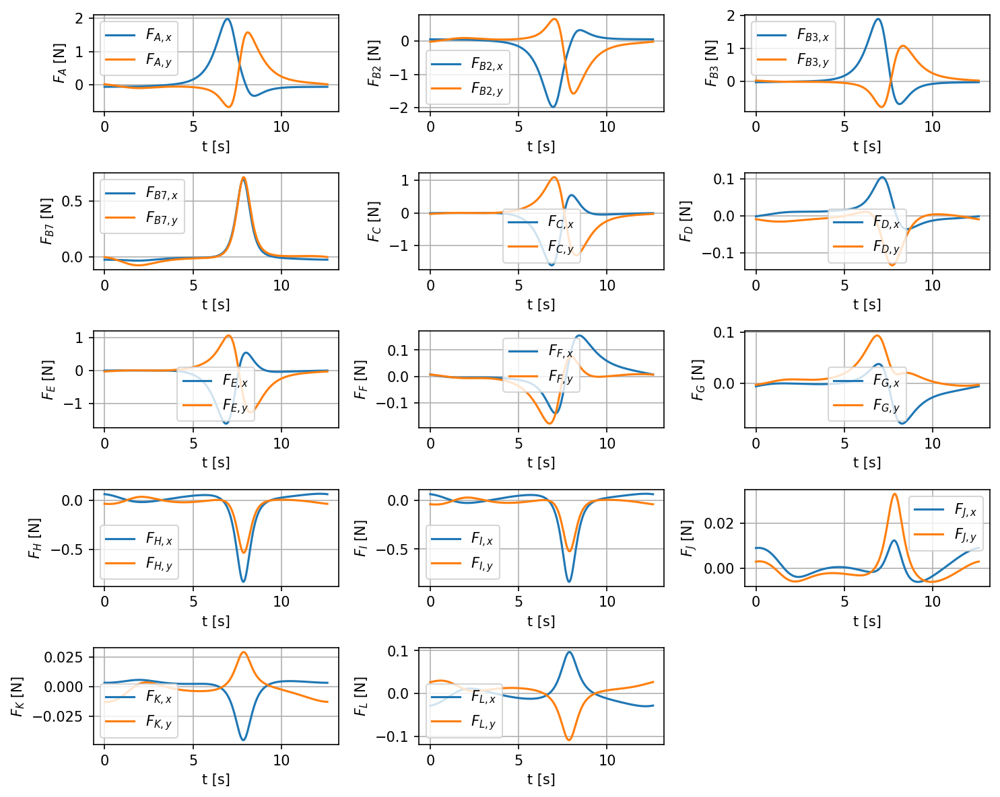

In [29]:
# Plotting forces
plt.close('all')
plt.ion()
plt.figure(figsize=(10, 8))

forces_x = [F_A_x, F_B_x2, F_B_x3, F_B_x7, F_C_x, F_D_x, F_E_x, F_F_x, F_G_x,
             F_H_x, F_I_x, F_J_x, F_K_x, F_L_x]
forces_y = [F_A_y, F_B_y2, F_B_y3, F_B_y7, F_C_y, F_D_y, F_E_y, F_F_y, F_G_y,
             F_H_y, F_I_y, F_J_y, F_K_y, F_L_y]
labels = [r'$F_{A', r'$F_{B2', r'$F_{B3', r'$F_{B7', r'$F_{C', r'$F_{D', r'$F_{E',
          r'$F_{F', r'$F_{G', r'$F_{H', r'$F_{I', r'$F_{J', r'$F_{K', r'$F_{L']
forces = forces_x + forces_y

# Create subplots for forces
for i, (force_x, force_y, label) in enumerate(zip(forces_x, forces_y, labels), start=1):
    plt.subplot(5, 3, i)
    plt.plot(t, force_x, label=str(label) + ',x}$')
    plt.plot(t, force_y, label=str(label) + ',y}$')
    plt.xlabel('t [s]')
    plt.ylabel(str(label) + '}$ [N]')
    plt.grid(True)
    plt.legend()

plt.tight_layout()
plt.show()

Around t = 8 s, a significant increase in forces is observed at nodes A, B, C and E. This coincides with a rapid movement of nodes F and G, as seen in the velocity vector plot. The large accelerations at F and G generate inertial forces that must be transmitted through the structure. These forces are primarily absorbed at the base nodes A, B, C and E,resulting in the observed peaks in their reaction forces.

Driving moment at joint P and input power needed.

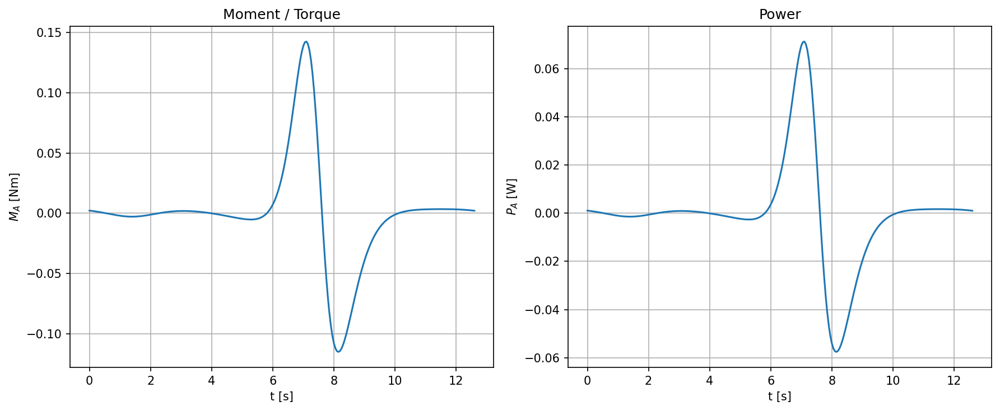

In [30]:
P_A = M_A * dtheta_2 # Power needed

plt.figure(figsize=(12, 5))

# Plot torque
plt.subplot(1, 2, 1)
plt.plot(t, M_A)
plt.xlabel('t [s]')
plt.ylabel(r'$M_A$ [Nm]')
plt.title('Moment / Torque')
plt.grid()

# Plot power
plt.subplot(1, 2, 2)
plt.plot(t, P_A)
plt.xlabel('t [s]')
plt.ylabel(r'$P_A$ [W]')
plt.title('Power')
plt.grid()

plt.tight_layout()
plt.show()

The power plot shows a sharp positive peak around 6–7 seconds, followed by a significant negative dip around 8 seconds. This indicates that a large amount of energy is required to accelerate the moving parts of the system — particularly nodes F and G. Once these nodes reach high velocities (as shown in the position snapshots), their inertia causes them to feed energy back into the system, resulting in a negative power peak. This dynamic is also reflected in the torque plot, which shows a corresponding reversal in direction.

### Checks for dynamic analysis
We will check our inverse kinematics calculations by using two methods:
1. Variation of kinematic energy
2. Conservation of momentum

#### Variation of kinematic energy

$M_A \omega_2 = \sum (m_i (v_i \cdot a_i) + I_{cgi}(\omega_i \cdot \alpha_i))$

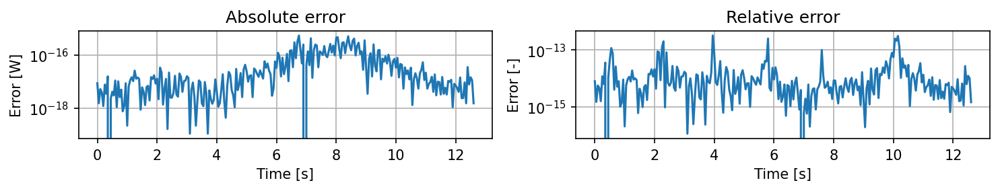

In [31]:
# M_A = np.zeros_like(theta_2)

LHS = M_A * dtheta_2

RHS = np.zeros_like(theta_2)
for i in range(len(theta_2)):
    RHS[i] = (m2 * np.dot(v_2[i], acc_2[i]) + J2 * dtheta_2[i] * ddtheta_2[i] +
              m3 * np.dot(v_3[i], acc_3[i]) + J3 * dtheta_3[i] * ddtheta_3[i] +
              m4 * np.dot(v_4[i], acc_4[i]) + J4 * dtheta_4[i] * ddtheta_4[i] +
              m5 * np.dot(v_5[i], acc_5[i]) + J5 * dtheta_5[i] * ddtheta_5[i] +
              m6 * np.dot(v_6[i], acc_6[i]) + J6 * dtheta_6[i] * ddtheta_6[i] +
              m7 * np.dot(v_7[i], acc_7[i]) + J7 * dtheta_7[i] * ddtheta_7[i] +
              m8 * np.dot(v_8[i], acc_8[i]) + J8 * dtheta_8[i] * ddtheta_8[i] +
              m9 * np.dot(v_9[i], acc_9[i]) + J9 * dtheta_9[i] * ddtheta_9[i] +
              m10 * np.dot(v_10[i], acc_10[i]) + J10 * dtheta_10[i] * ddtheta_10[i])

# Create a figure the plot the absolute and relative error
# The absolute error is the difference between the left-hand side and the right-hand side of the equation
# The relative error is the absolute error divided by the right-hand side of the equation
absolute_error = np.abs(LHS - RHS)
relative_error = np.abs(absolute_error / RHS)

# Reset the previous plots so they don't show up again
plt.close('all')

fig, ax = plt.subplots(1, 2, figsize=(10, 2))
ax[0].plot(t, absolute_error)
ax[0].set_title('Absolute error')
ax[0].set_xlabel('Time [s]')
ax[0].set_ylabel('Error [W]')
ax[0].set_yscale('log')  # Set y-axis to log scale
ax[0].grid()

ax[1].plot(t, relative_error)
ax[1].set_title('Relative error')
ax[1].set_xlabel('Time [s]')
ax[1].set_ylabel('Error [-]')
ax[1].set_yscale('log')  # Set y-axis to log scale
ax[1].grid()

fig.tight_layout()
plt.show()

#### Conservation of momentum
$F_{ext, total, x}(t) = \sum m_i  a_{ix} $

$F_{ext, total, y}(t) = \sum m_i  a_{iy} $

$M_{ext, total, O} = \sum (I_{cogi} \alpha_i + m_i (r_i \times a_i)) $

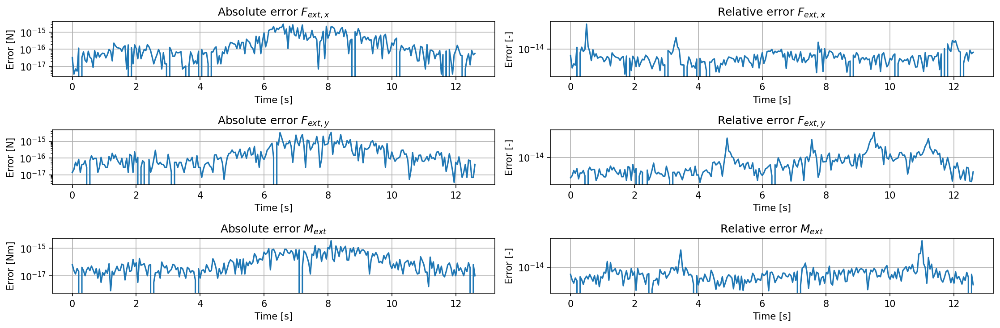

In [32]:
# Calculate the equation for the x-axis of the external forces
LHS = F_A_x + F_C_x + F_D_x + F_I_x + F_J_x
RHS = m2 * acc_2x + m3 * acc_3x + m4 * acc_4x + m5 * acc_5x + m6 * acc_6x + m7 * acc_7x + m8 * acc_8x + m9 * acc_9x + m10 * acc_10x

absolute_error_x = np.abs(LHS - RHS)
relative_error_x = np.abs(absolute_error_x / RHS)

# Calculate the equation for the y-axis of the external forces
LHS = F_A_y + F_C_y + F_D_y + F_I_y + F_J_y
RHS = m2 * acc_2y + m3 * acc_3y + m4 * acc_4y + m5 * acc_5y + m6 * acc_6y + m7 * acc_7y + m8 * acc_8y + m9 * acc_9y + m10 * acc_10y

absolute_error_y = np.abs(LHS - RHS)
relative_error_y = np.abs(absolute_error_y / RHS)

# Calculate the equation for the external torque around rotation center A
r2_origin = A_cog2_vec
r3_origin = AB_vec + B_cog3_vec
r4_origin = AB_vec + BE_vec - C_cog4_vec
r5_origin = AB_vec + BF_vec + FG_vec - D_cog5_vec
r6_origin = AB_vec + BF_vec + F_cog6_vec
r7_origin = AB_vec + B_cog7_vec
r8_origin = AB_vec + BH_vec - I_cog8_vec
r9_origin = AB_vec + BL_vec - KL_vec - J_cog9_vec
r10_origin = AB_vec + BL_vec - K_cog10_vec

r_C_origin = AB_vec + BE_vec - CE_vec
r_D_origin = AB_vec + BF_vec + FG_vec - DG_vec
r_I_origin = AB_vec + BH_vec - IH_vec
r_J_origin = AB_vec + BL_vec - KL_vec - JK_vec

F_A_vec = np.column_stack((F_A_x, F_A_y, np.zeros_like(theta_2)))
F_C_vec = np.column_stack((F_C_x, F_C_y, np.zeros_like(theta_2)))
F_D_vec = np.column_stack((F_D_x, F_D_y, np.zeros_like(theta_2)))
F_I_vec = np.column_stack((F_I_x, F_I_y, np.zeros_like(theta_2)))
F_J_vec = np.column_stack((F_J_x, F_J_y, np.zeros_like(theta_2)))

LHS = M_A + np.cross(r_C_origin, F_C_vec)[:, 2] + np.cross(r_D_origin, F_D_vec)[:, 2] + np.cross(r_I_origin, F_I_vec)[:, 2] + np.cross(r_J_origin, F_J_vec)[:, 2]
RHS = np.zeros_like(theta_2)  # Initialiseer RHS
for i in range(len(theta_2)):
    RHS[i] = (
            J2 * ddtheta_2[i] + m2 * np.cross(r2_origin[i], acc_2[i])[2] +
            J3 * ddtheta_3[i] + m3 * np.cross(r3_origin[i], acc_3[i])[2] +
            J4 * ddtheta_4[i] + m4 * np.cross(r4_origin[i], acc_4[i])[2] +
            J5 * ddtheta_5[i] + m5 * np.cross(r5_origin[i], acc_5[i])[2] +
            J6 * ddtheta_6[i] + m6 * np.cross(r6_origin[i], acc_6[i])[2] +
            J7 * ddtheta_7[i] + m7 * np.cross(r7_origin[i], acc_7[i])[2] +
            J8 * ddtheta_8[i] + m8 * np.cross(r8_origin[i], acc_8[i])[2] +
            J9 * ddtheta_9[i] + m9 * np.cross(r9_origin[i], acc_9[i])[2] +
            J10 * ddtheta_10[i] + m10 * np.cross(r10_origin[i], acc_10[i])[2]
        )

# Calculate the absolute and relative error
absolute_error_m = np.abs(LHS - RHS)
relative_error_m = np.abs(absolute_error_m / RHS)

# Reset the previous plots so they don't show up again
plt.close('all')

fig, ax = plt.subplots(3, 2, figsize=(15, 5))
ax[0, 0].plot(t, absolute_error_x)
ax[0, 0].set_title('Absolute error $F_{ext,x}$')
ax[0, 0].set_xlabel('Time [s]')
ax[0, 0].set_ylabel('Error [N]')
ax[0, 0].set_yscale('log')
ax[0, 0].grid()

ax[0, 1].plot(t, relative_error_x)
ax[0, 1].set_title('Relative error $F_{ext,x}$')
ax[0, 1].set_xlabel('Time [s]')
ax[0, 1].set_ylabel('Error [-]')
ax[0, 1].set_yscale('log')
ax[0, 1].grid()

ax[1, 0].plot(t, absolute_error_y)
ax[1, 0].set_title('Absolute error $F_{ext,y}$')
ax[1, 0].set_xlabel('Time [s]')
ax[1, 0].set_ylabel('Error [N]')
ax[1, 0].set_yscale('log')
ax[1, 0].grid()

ax[1, 1].plot(t, relative_error_y)
ax[1, 1].set_title('Relative error $F_{ext,y}$')
ax[1, 1].set_xlabel('Time [s]')
ax[1, 1].set_ylabel('Error [-]')
ax[1, 1].set_yscale('log')
ax[1, 1].grid()

ax[2, 0].plot(t, absolute_error_m)
ax[2, 0].set_title('Absolute error $M_{ext}$')
ax[2, 0].set_xlabel('Time [s]')
ax[2, 0].set_ylabel('Error [Nm]')
ax[2, 0].set_yscale('log')
ax[2, 0].grid()

ax[2, 1].plot(t, relative_error_m)
ax[2, 1].set_title('Relative error $M_{ext}$')
ax[2, 1].set_xlabel('Time [s]')
ax[2, 1].set_ylabel('Error [-]')
ax[2, 1].set_yscale('log')
ax[2, 1].grid()

fig.tight_layout()
plt.show()

In both cases, the relative errors remain between $10^{-13}$ and $10^{-15}$, which indicates excellent numerical agreement and confirms the correctness of the implementation.


### Shaking forces

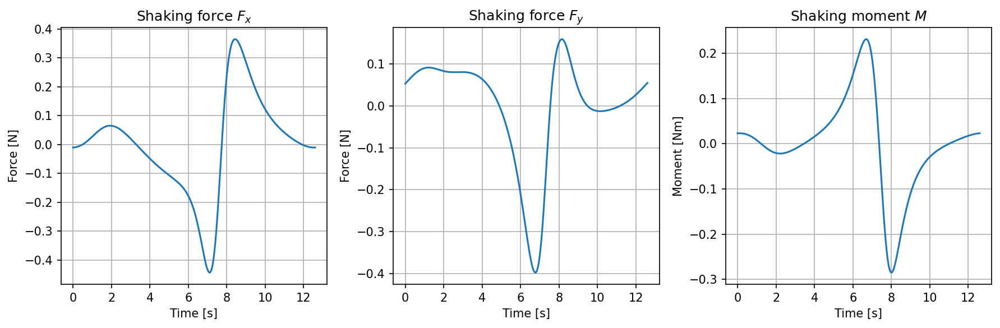

In [33]:
# Bereken shaking forces als negatieve van de som van de externe krachten
F_shaking_x = -(F_A_x + F_C_x + F_D_x + F_I_x + F_J_x)
F_shaking_y = -(F_A_y + F_C_y + F_D_y + F_I_y + F_J_y)

# Bereken shaking moment (om punt A bijvoorbeeld)
M_shaking = -(
    np.cross(r_C_origin, F_C_vec)[:, 2] +
    np.cross(r_D_origin, F_D_vec)[:, 2] +
    np.cross(r_I_origin, F_I_vec)[:, 2] +
    np.cross(r_J_origin, F_J_vec)[:, 2] +
    M_A
)

# Plot shaking forces en moment
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.plot(t, F_shaking_x)
plt.title('Shaking force $F_x$')
plt.xlabel('Time [s]')
plt.ylabel('Force [N]')
plt.grid()

plt.subplot(1, 3, 2)
plt.plot(t, F_shaking_y)
plt.title('Shaking force $F_y$')
plt.xlabel('Time [s]')
plt.ylabel('Force [N]')
plt.grid()

plt.subplot(1, 3, 3)
plt.plot(t, M_shaking)
plt.title('Shaking moment $M$')
plt.xlabel('Time [s]')
plt.ylabel('Moment [Nm]')
plt.grid()

plt.tight_layout()
plt.show()

Between 6 and 9 seconds, we observe distinct peaks in both the shaking forces and the shaking moment. These are caused by the rapid acceleration and deceleration of nodes F and G. Around 6–7 s, the system requires a significant input torque to accelerate these masses, resulting in increased reaction forces at the base. Around 8 s, the velocity of these nodes peaks and their inertia generates a dynamic load in the opposite direction, leading to the negative peak. This behaviour is typical for systems with high accelerations and illustrates the effect of inertial loads being transferred to the ground structure.

### Insights of the mechanism

At t = 8.10 s, the mechanism passes through a dead configuration where bars 2 and 7 become collinear. In this geometric alignment, the system reaches a singular configuration, meaning that small inputs lead to disproportionately large internal forces and accelerations. This is clearly reflected in the observed plots:

*   Reaction forces at joints A, B and C peak sharply,
*   Input torque and power show a strong transient increase,
*   Shaking forces and moment reach their maximum amplitudes.

Although the system remains controllable, this configuration significantly amplifies inertial effects and leads to high dynamic loads. From both a physical and numerical perspective, this is a critical position that should be identified and monitored during design or control. It highlights the sensitivity of linkage systems to singularities, even if no instability occurs.